In [1]:
from multiprocessing import Pool
import os
os.environ['OMP_NUM_THREADS'] = "1"

import numpy as np

import astropy.units as u  
import astropy.constants as c
from astropy.coordinates import SkyCoord

import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib 

from astropy.io import fits
from astropy.table import Table, join
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit
from scipy.stats import spearmanr

from dustmaps.bayestar import BayestarQuery
from dustmaps.vergely2022 import Vergely2022Query
from dustmaps.edenhofer2023 import Edenhofer2023Query

import pickle 
import sys
import os
import tqdm

import emcee
import corner

import h5py

In [2]:
import globalvars
dust_data = globalvars.DustData()

In [3]:
from sightline import Sightline
from specfns import get_wavs, resample_interp, dopplershift, lambda0, sigma0
from filehandling import get_ca_res, get_madgics_res
from spacefns_v2 import select_stars, find_nearest, find_radius, differentialAmplitude
from MCMCfns import logprob_2
import time

# import globalvars
# dust_data = globalvars.DustData()
# with h5py.File(map_fname, 'r') as f:
#     edenhofer = np.array(f['data'])
#     dust_data.intake_map(edenhofer)

In [4]:
map_fname = '/uufs/astro.utah.edu/common/home/u1371365/DIB_KT_CACloud/edenhofer_out.h5'

with h5py.File(map_fname, 'r') as f:
    edenhofer = np.array(f['data'])
    dust_data.intake_map(edenhofer)

In [5]:
CA_meta = Table(fits.open('../Data/230420_CAResiduals/CA_meta.fits')[1].data)
CAresdir = '/uufs/astro.utah.edu/common/home/u1371365/Data/230420_CAResiduals/'
CAMADGICSresdir = '/uufs/astro.utah.edu/common/home/u1371365/Data/230829_MADGICSResiduals/'
starhorsepath = '/uufs/chpc.utah.edu/common/home/sdss/dr17/env/APOGEE_STARHORSE/APOGEE_DR17_EDR3_STARHORSE_v2.fits'
starhorse = Table.read(starhorsepath, hdu = 1)
starhorse = starhorse['APOGEE_ID', 'dist16', 'dist50', 'dist84', 'AV16', 'AV50', 'AV84']

CA_meta = join(CA_meta, starhorse, keys = 'APOGEE_ID', join_type = 'left')

CA_meta_full = CA_meta.copy()

with open('/uufs/astro.utah.edu/common/home/u1371365/DIB_KT_CACloud/goodbad.pickle', mode = 'rb') as f:
    goodbad = pickle.load(f)

# added 02.01
data_criteria = (((CA_meta['SNR'] > 80) & (CA_meta['TEFF'] > 5000)) | (CA_meta['SNR'] > 150)) & (CA_meta['ASPCAP_CHI2_1'] > 1) & (CA_meta['ASPCAP_CHI2_1'] < 5)
print(np.sum(data_criteria))
CA_meta= CA_meta[data_criteria]

1010


In [6]:
wavs = get_wavs()
window = (wavs > lambda0 -10) & (wavs < lambda0 + 10)
wavs_window = wavs[window]

In [7]:
ds = 2.5 # x downsampled
rad = 0.23
sample_dim_l = np.linspace(159, 167, int(8 / (ds * rad)))
sample_dim_b = np.linspace(-12.5 , -4.5, int(8 / (ds * rad)))
sample_grid_l, sample_grid_b = np.meshgrid(sample_dim_l, sample_dim_b)
grid_map_inds = np.array([find_nearest(sample_grid_l.flatten()[i], sample_grid_b.flatten()[i]) for i in range(len(sample_grid_l.flatten()))]).T
grid_map = np.nansum(np.copy(edenhofer[grid_map_inds[1], grid_map_inds[0], :]).reshape(*sample_grid_l.shape, -1), axis = 2)
grid_Nstar = np.array([np.nansum((np.abs((sample_grid_l.flatten()[i] - CA_meta['GLON'])) <= rad) & 
            (np.abs((sample_grid_b.flatten()[i] - CA_meta['GLAT'])) <= rad)) for i in range(len(sample_grid_l.flatten()))]).reshape(*sample_grid_l.shape)

filament_l = (159, 169)
filament_b = (-10, -6)

N_min = 5
radius_min = np.zeros(sample_grid_l.shape)
mgrid = np.mgrid[0:len(sample_dim_l), 0:len(sample_dim_b)]
for i in mgrid[0].flatten():
    for j in mgrid[1].flatten():
        radius_min[i, j] = find_radius(sample_grid_l[i, j], sample_grid_b[i, j], N_min, CA_meta)
        radius_min[i, j] = np.max([radius_min[i, j], 0.23])

radius_max = 0.4
print(np.nansum(radius_min < radius_max))


crit_filament = ((sample_grid_l > filament_l[0]) & (sample_grid_l < filament_l[1]) & 
                 (sample_grid_b > filament_b[0]) & (sample_grid_b < filament_b[1]) &
                 (grid_map > 2.2) & (radius_min < 0.5)) #(grid_Nstar > 5) & (grid_Nstar <= 10))

crit_background =  (((sample_grid_l <= filament_l[0]) | (sample_grid_l >= filament_l[1]) |
                 (sample_grid_b <= filament_b[0]) | (sample_grid_b >= filament_b[1])) &
                 (grid_map <= 1.5) & (radius_min < radius_max)) #(grid_Nstar > 5) & (grid_Nstar <= 10))

# crit_coverage = (np.sum() => 1 & )

N_filament = np.sum(crit_filament)
N_background = np.sum(crit_background)
print(np.sum(crit_filament))
print(np.sum(crit_background))

91
23
28


In [8]:
l_fil, b_fil, AV_fil = (sample_grid_l[crit_filament].flatten(), sample_grid_b[crit_filament].flatten(),
                        grid_map[crit_filament].flatten())
l_off, b_off, AV_off = (sample_grid_l[crit_background].flatten(), sample_grid_b[crit_background].flatten(),
                        grid_map[crit_background].flatten())

l_sample, b_sample, AV_sample = (np.concatenate([l_fil, l_off]), np.concatenate([b_fil, b_off]),
                                  np.concatenate([AV_fil, AV_off]))

In [9]:
radius_min_fil = radius_min[crit_filament].flatten()
radius_min_off = radius_min[crit_background].flatten()
radius_sample = np.concatenate([radius_min_fil, radius_min_off])

selected_inds = []
for i in range(len(l_sample)):
    l_center, b_center = l_sample[i], b_sample[i]
    rad_i = radius_sample[i]
    selection = select_stars(CA_meta, l_center, b_center, radius = rad_i)
    print(len(selection))
    selected_inds.append(selection)

5
5
5
5
5
5
5
5
5
5
7
5
5
5
5
5
5
7
6
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
14
5
5
6
5
5
5
5
6
5
5
5
5
5
5
6


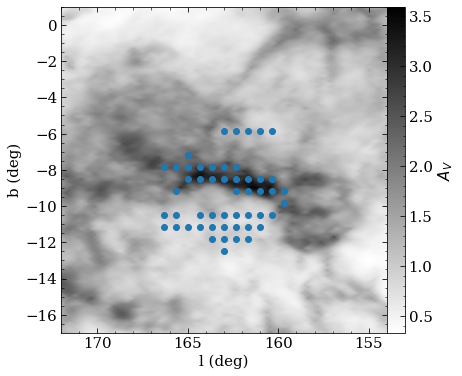

In [10]:
if True: 
    fig, ax = plt.subplots(figsize = (6,6))

    im = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'binary', extent = (dust_data.l0-9, dust_data.l0+9, dust_data.b0-9, dust_data.b0+9))
    ax.set_xlabel('l (deg)')
    ax.set_ylabel('b (deg)')
    # ax.scatter(CA_meta['GLON'], CA_meta['GLAT'], marker = '.')

    # masks = (np.nansum(dust_data.dustmap, axis = 2) >= 2.2).astype(float)
    # masks_2 = ((np.nansum(dust_data.dustmap, axis = 2) >= 1.5) & (np.nansum(dust_data.dustmap, axis = 2) < 2.2)).astype(float)
    # masks_3 = (np.nansum(dust_data.dustmap, axis = 2) < 1.5).astype(float)
    # im_mask = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'Reds', alpha = masks, extent = (dust_data.l0-9, dust_data.l0+9, dust_data.b0-9, dust_data.b0+9))
    # im_mask_2 = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'Greens', alpha = masks_2, extent = (l0-9, l0+9, dust_data.b0-9, dust_data.b0+9))
    # im_mask_3 = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'Purples', alpha = masks_3, extent = (dust_data.l0-9, dust_data.l0+9, dust_data.b0-9, dust_data.b0+9))

    # for i in range(len(sample_grid_l)):
    #     circ= matplotlib.patches.Circle((sample_grid_l[i], sample_grid_b[i]), radius_sample[i], transform =ax.transData)

    #     ax.add_patch(circ)
    # ax.scatter(sample_grid_l, sample_grid_b, alpha = (crit_filament).astype(float), color = 'C0', label = 'Filtered Sightlines', )
    # ax.scatter(sample_grid_l, sample_grid_b, alpha = (crit_background).astype(float),  color = 'C0')
        
    ax.scatter(l_sample, b_sample,  color = 'C0')


    cax0 = ax.inset_axes([dust_data.l0-10,dust_data.b0-9 , 1, 18], transform =ax.transData)

    fig.colorbar(im, ax = ax, cax = cax0, label = '$A_V$')
    xmin, xmax = ax.get_xlim()
    # ax.legend(loc = 'upper left')
    ax.set_xlim(xmax, xmin)

    plt.show()

In [11]:
from sightline import Sightline

In [12]:
sightlines = []
for i in range(len(selected_inds)):
    indx = selected_inds[i]
    sightlines.append(Sightline(CA_meta[indx], MADGICS = False, dustdata = dust_data))
    sightlines[i].intake_coords(l_sample, b_sample, AV = AV_sample)

/uufs/astro.utah.edu/common/home/u1371365/nanoKT_v1/residual_process.py:7: RuntimeWarning: invalid value encountered in true_divide
  res = hdu_rf[0, :] / hdu_rf[2, :]
/uufs/astro.utah.edu/common/home/u1371365/nanoKT_v1/residual_process.py:8: RuntimeWarning: divide by zero encountered in true_divide
  res_corr = res / hdu_rf[4, :]


In [13]:
from MCMCfns import logprob_2

In [14]:
def MCMC_scary(sl, steps = 1000, nwalkers = 100, pool = None):
    ndim = len(sl.voxel_dAVdd) 
    nstar = len(sl.stars)
    ndim_amp = int(ndim + ndim * nstar)
    

    # dAVdd_prior = sl.dAVdd[:]
    # dAVdd_prior[dAVdd_prior == 0] = np.nan 
    # dAVdd_prior_med = np.nanmedian(dAVdd_prior, axis = 1)
    # dAVdd_prior_std = np.nanstd(dAVdd_prior, axis = 1, ddof = 1)
    # gaussparams = (dAVdd_prior_med, dAVdd_prior_std)
    # print(gaussparams)

    # with Pool(15) as pool:

    sampler = emcee.EnsembleSampler(nwalkers, ndim_amp , logprob_2, 
                                    kwargs={'sl': sl,  'prior_mult':  1, 'v_max': 20, 'sigma': None}, pool = pool)
    # init = 12.5 *(np.random.random((nwalkers, ndim_amp)) - 0.5)
    init = 10 *  (np.random.random((nwalkers, ndim_amp)) - 0.5)

    init[:, ndim:] = np.abs(sl.dAVdd.ravel()[np.newaxis, :] + 0.1*(np.random.random(init[:, ndim:].shape)-0.5))
    print('NDIM:', ndim, 'NSTAR:', nstar, 'INITSHAPE:', init.shape)
    
    sampler.run_mcmc(init,  steps, progress = True);
    
    return sampler, ndim, ndim_amp

In [15]:
stp = 1500
# sampler, ndim, ndim_amp = MCMC_scary(a, steps = stp, nwalkers = 500)
# sampler1, ndim1, ndim_amp1 = MCMC(a1, steps = stp)
# sampler2, ndim2, ndim_amp2 = MCMC(a2, steps = stp)
# sampler3, ndim3, ndim_amp3 = MCMC(a3, steps = stp)

run_label = 'kt_0206a'
save_individual = False

first_run = False



if first_run:
    if not os.path.exists(os.getcwd() + '/RUNS/' + run_label):
        os.makedirs(os.getcwd() +'/RUNS/' + run_label)
    with Pool(20) as pool:
        for i in range(len(sightlines)):
            try:
                sl_i = sightlines[i]
                smplr, ndm, ndm_amp = MCMC_scary(sl_i, steps = stp, nwalkers = 500, pool = pool)
                # smplr_array.append(smplr)
                # mid = time.time()
                # print('Time mid - start', mid - start) # beat 7:22
                # smplr_, ndim_ = MCMC_vonly(sl_i, smplr, steps = 1200, nwalkers = 100, pool = None)
                # end = time.time()
                # print('Time end - start:',(end - start)/60)
                sl_i.intake(smplr)
                state = 'success'
            except Exception as e:
                print('Something went wrong')
                sl_i = None 
                state = 'fail'
                with open('RUNS/' + run_label + '/FAILS.txt', mode = 'a') as fails:
                    fails.write(str(e))
                
            with open('RUNS/' + run_label + '/LOG.txt', mode = 'a') as log:
                logstring = time.asctime() + ' | ' + str(i) + ' | ' + state + '\n'
                log.write(logstring)
            
            if save_individual == True:
                with open('RUNS/' + run_label + '/sl_{}.pickle'.format(i), mode = 'wb') as f:
                    pickle.dump(sl_i, f)

# sampler, ndim, ndim_amp = smplr, ndm, ndm_amp

In [16]:
name = run_label

# first_run = True

if first_run:
    f = open('RUNS/' + run_label + '/sightlines_{}.pickle'.format(name),'wb')
    pickle.dump(sightlines, f )
    f.close()
else:
    f = open('RUNS/' + run_label + '/sightlines_{}.pickle'.format(name), 'rb')

    sightlines = pickle.load(f)
    f.close()

In [17]:
def make_corner(sampler, labels, minval = 50):
    dim = sampler.chain.shape[-1]
    samples = sampler.chain[:, minval:, :].reshape((-1, dim))
    # print(samples)
    fig = corner.corner(samples, figsize = (20, 20), labels = labels)
    # for ax in fig.axes:
        # ax.set_xlim(-15, 15)
        # ax.set_ylim(-15, 15) 
    plt.show()

def make_corner_vonly(sampler, ndim, labels, minval = -100):
    samples = sampler.chain[:, minval:, :ndim].reshape((-1, ndim))
    print(samples.shape)
    # print(samples)
    fig = corner.corner(samples, figsize = (20, 20), labels = labels)
    # for ax in fig.axes:
        # ax.set_xlim(-15, 15)
        # ax.set_ylim(-15, 15) 
    plt.show()

if False:
    for i in range(0, len(sightlines), 4):
        sl_i = sightlines[i]
        ndim = len(sl_i.bins) - 1 
        make_corner_vonly(sl_i.sampler, ndim, labels = None, minval =-200)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 0
(5, 95) (5, 5, 95) (5, 5)


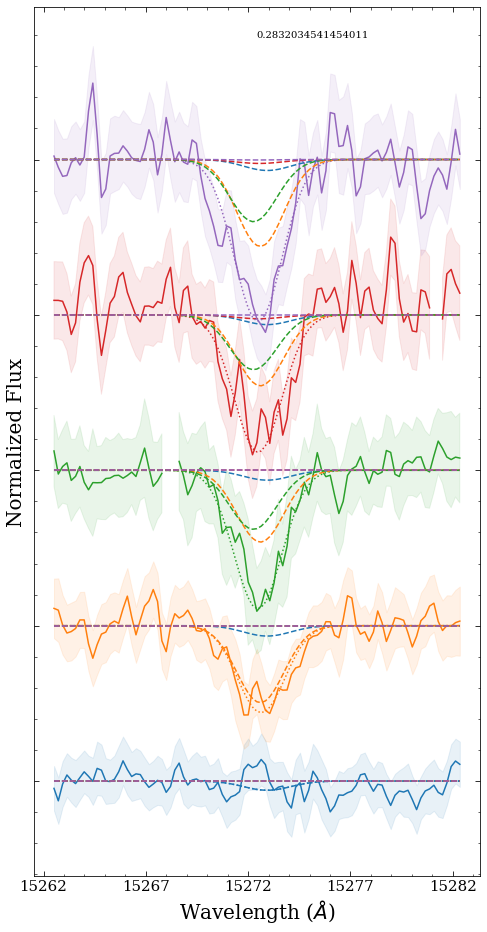

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 1
(5, 95) (5, 5, 95) (5, 5)


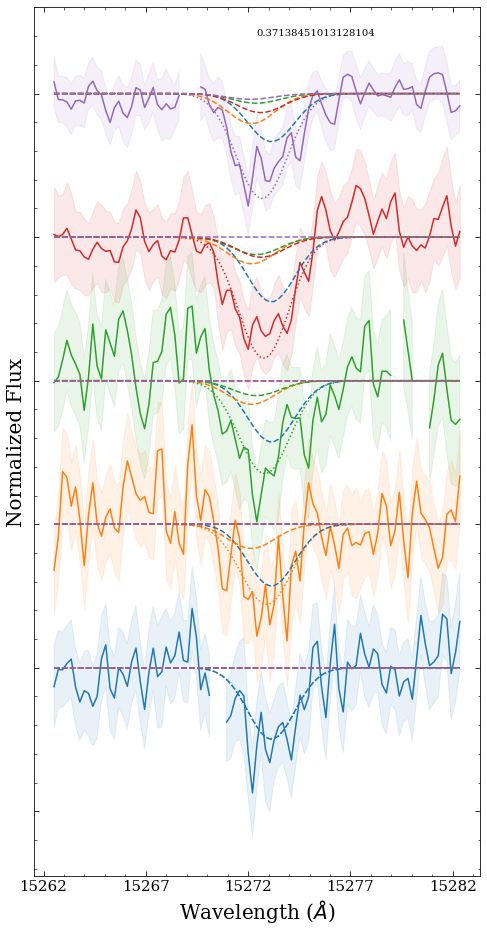

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 2
(5, 95) (5, 5, 95) (5, 5)


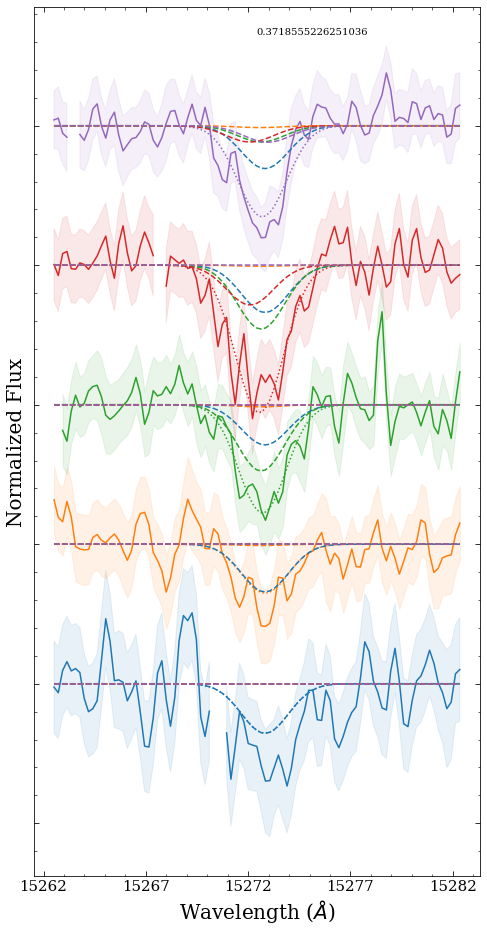

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 3
(5, 95) (5, 5, 95) (5, 5)


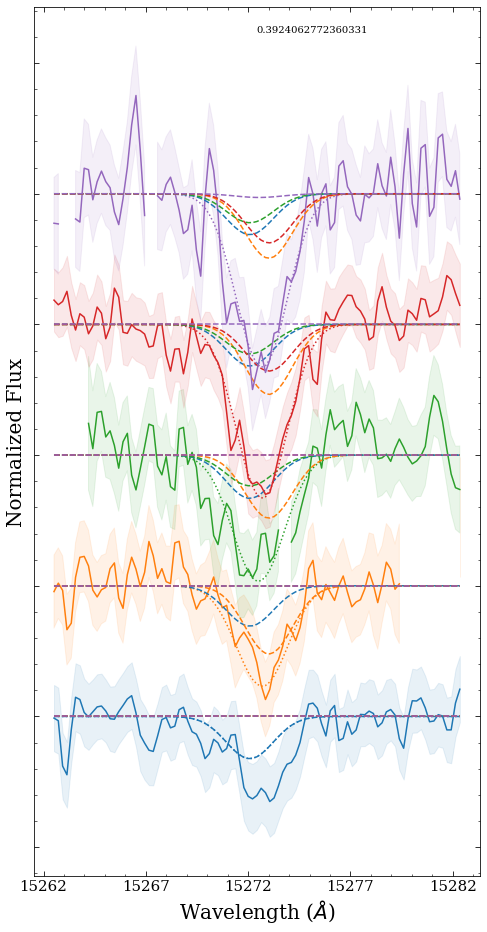

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 4
(5, 95) (5, 5, 95) (5, 5)


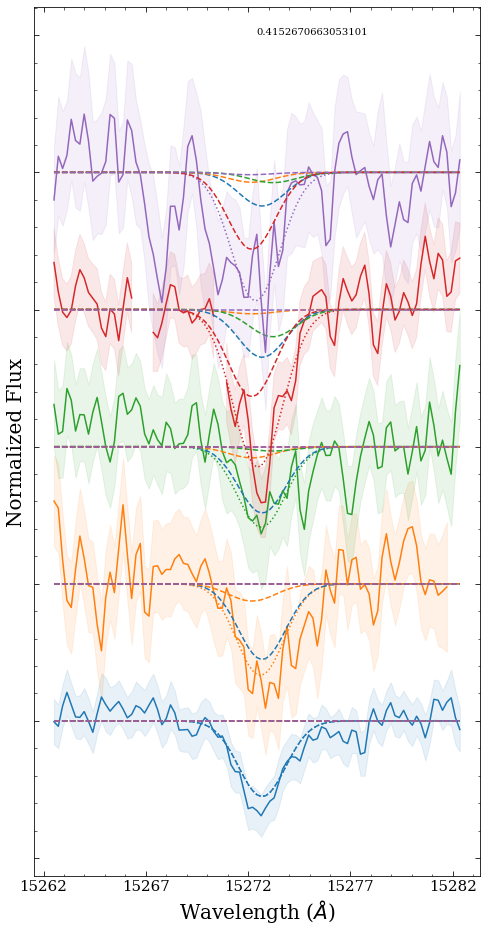

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 5
(5, 95) (5, 5, 95) (5, 5)


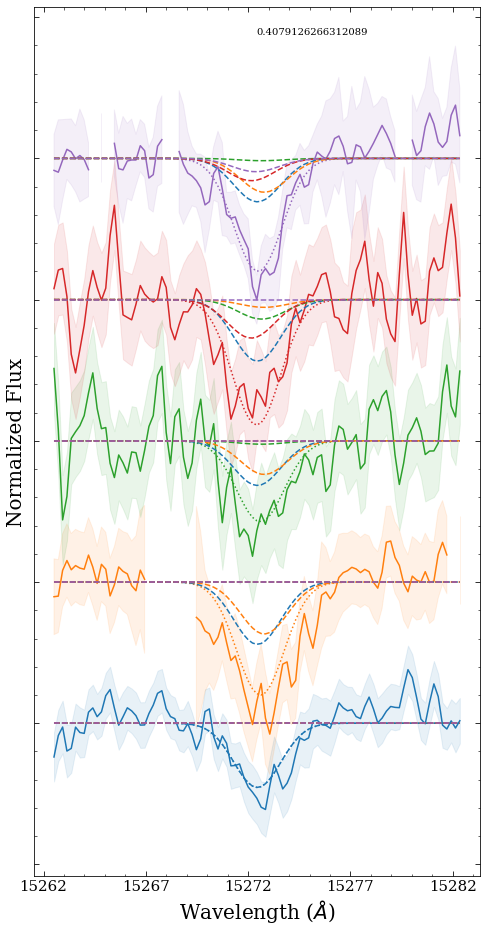

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 6
(5, 95) (5, 5, 95) (5, 5)


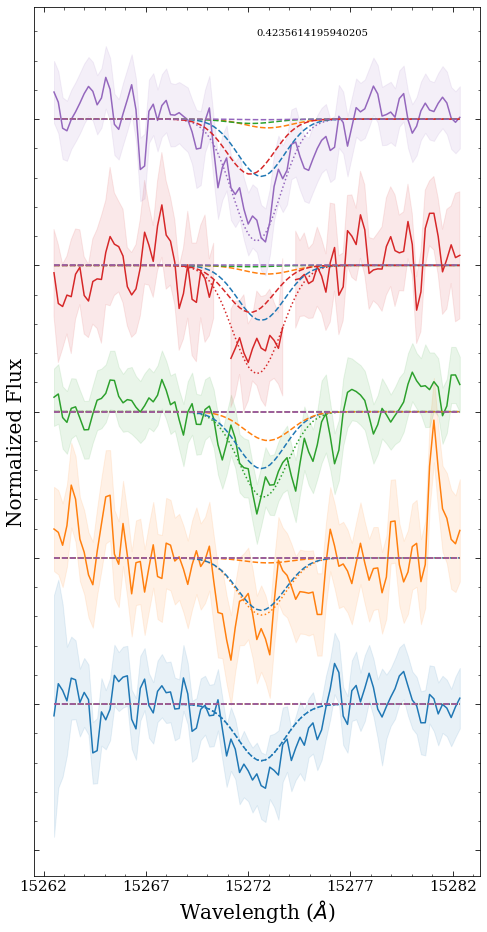

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 7
(5, 95) (5, 5, 95) (5, 5)


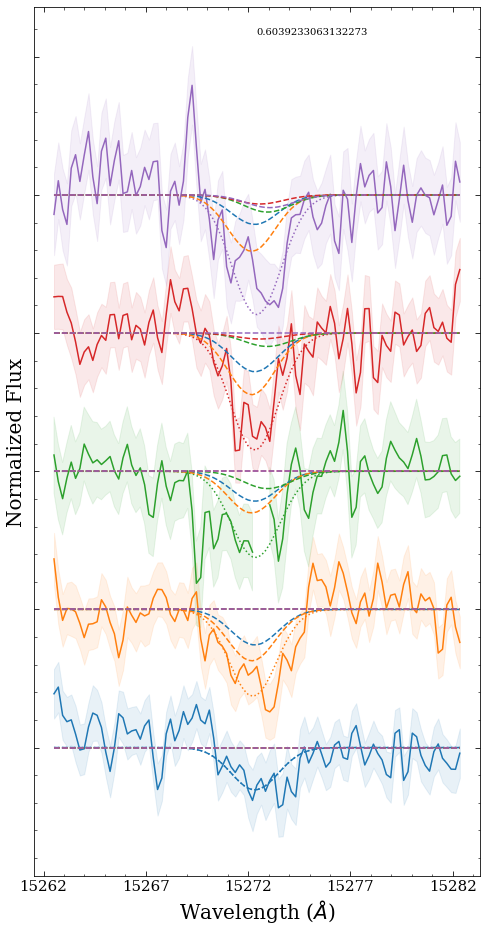

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 8
(5, 95) (5, 4, 95) (5, 4)


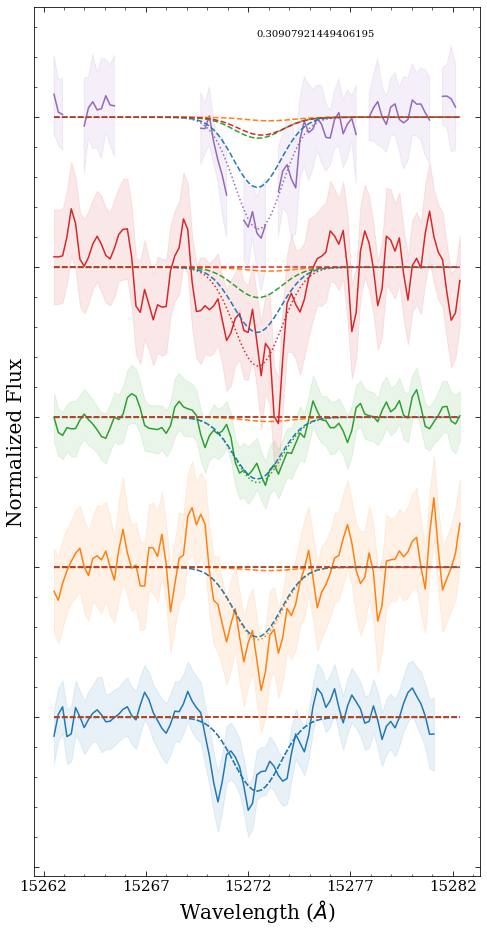

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 9
(5, 95) (5, 5, 95) (5, 5)


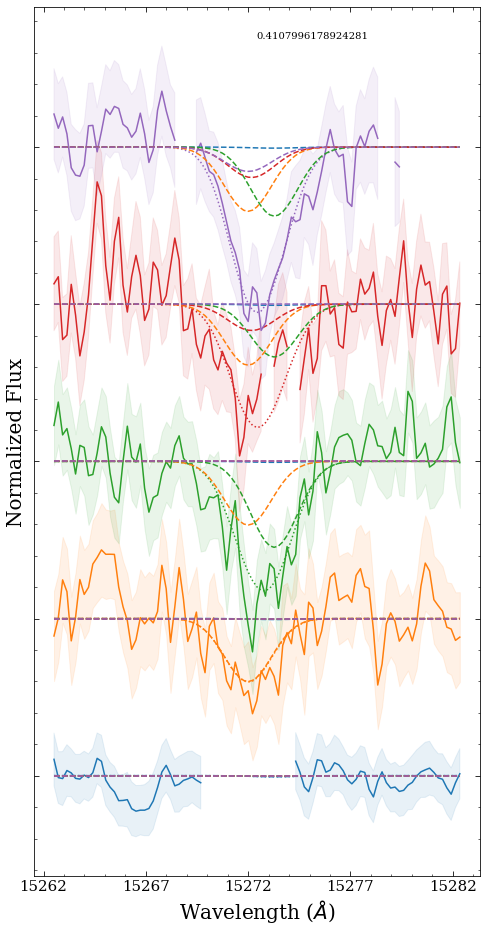

N 10


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(7, 95) (7, 7, 95) (7, 7)


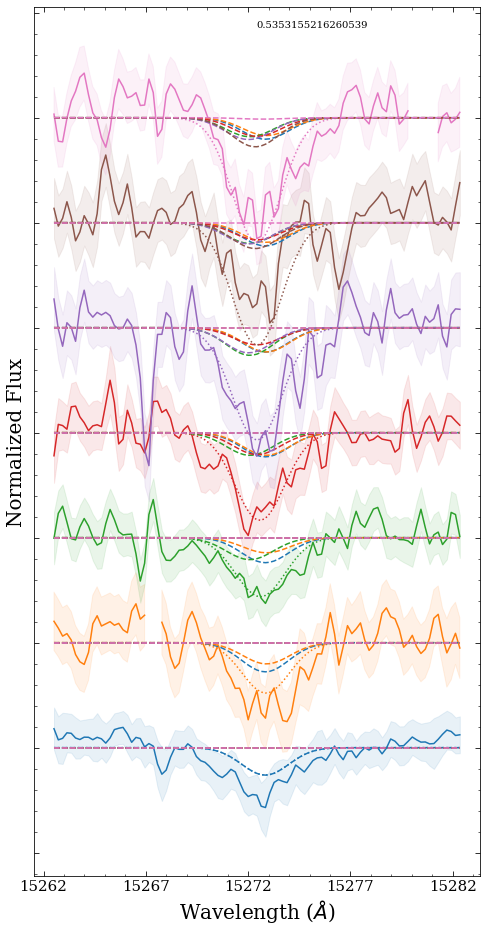

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 11
(5, 95) (5, 5, 95) (5, 5)


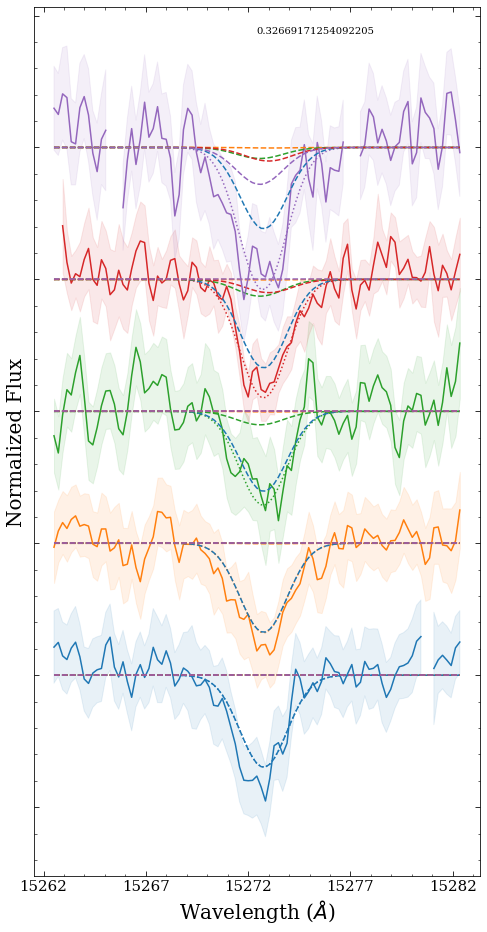

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 12
(5, 95) (5, 5, 95) (5, 5)


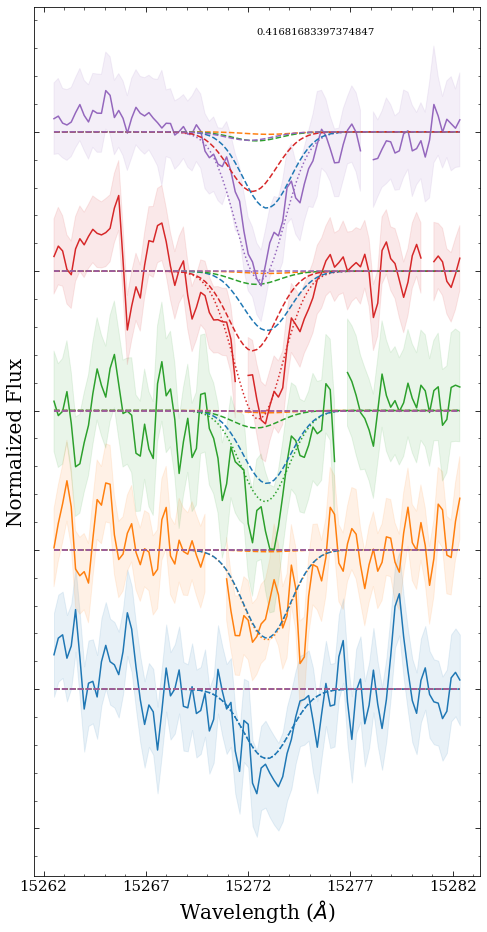

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 13
(5, 95) (5, 5, 95) (5, 5)


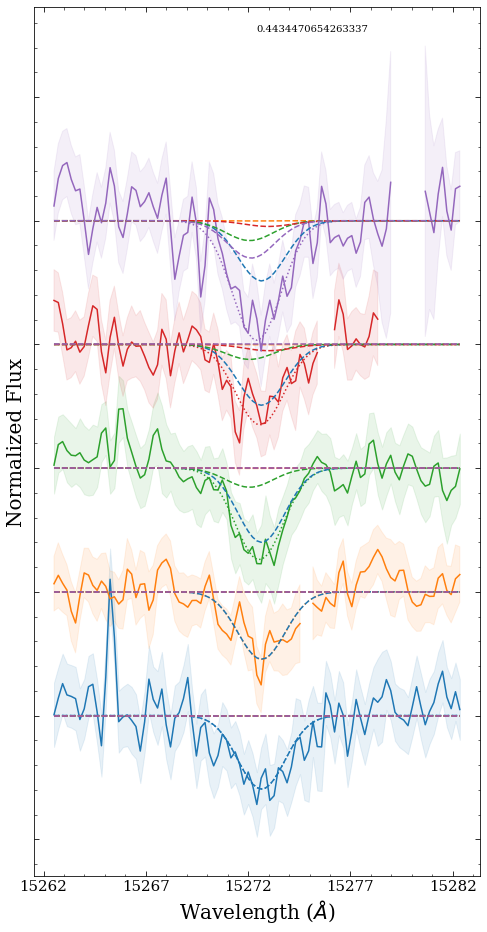

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 14
(5, 95) (5, 5, 95) (5, 5)


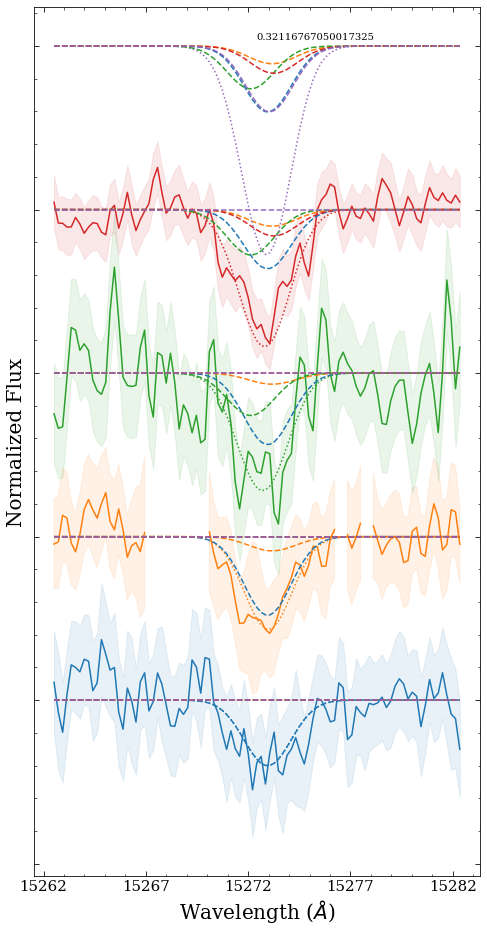

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 15
(5, 95) (5, 5, 95) (5, 5)


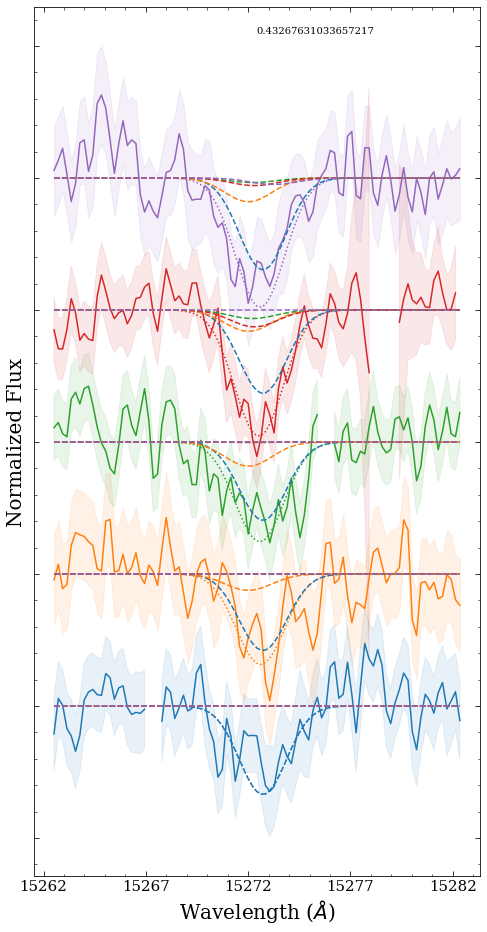

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 16
(5, 95) (5, 5, 95) (5, 5)


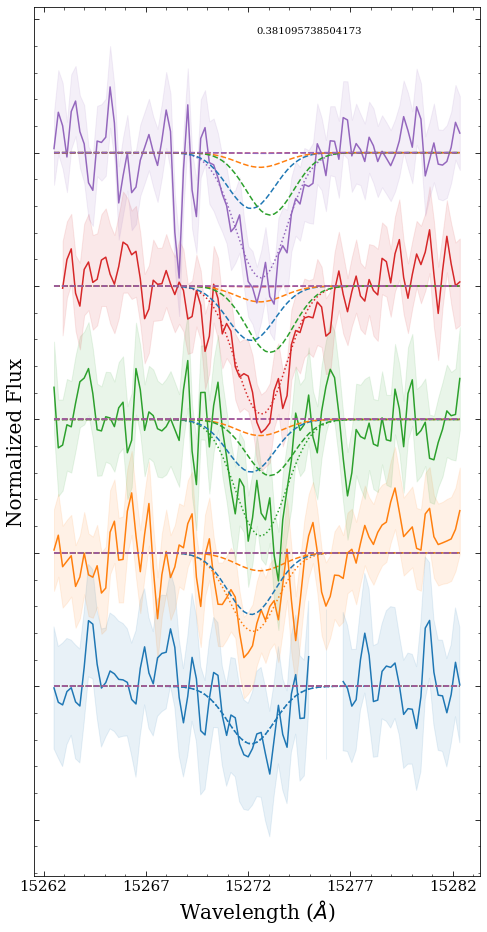

N 17


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(7, 95) (7, 7, 95) (7, 7)


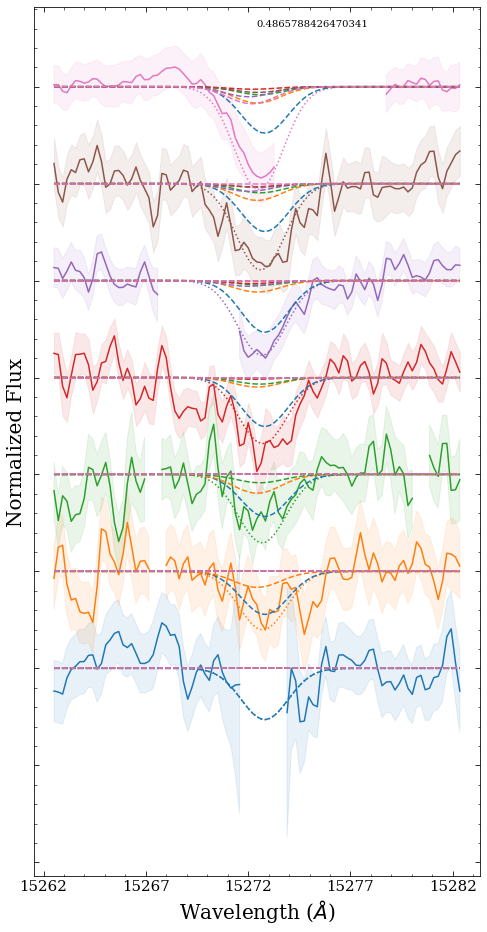

N 18
(6, 95) (6, 6, 95) (6, 6)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


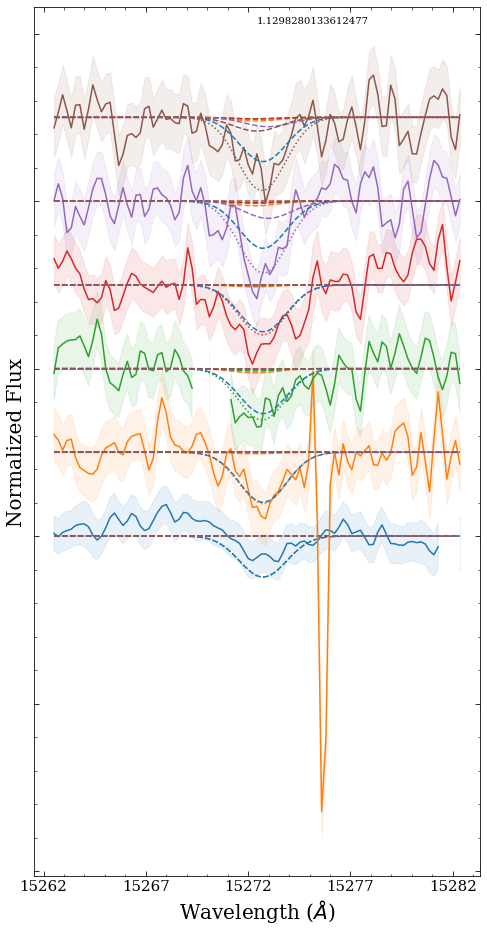

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 19
(5, 95) (5, 5, 95) (5, 5)


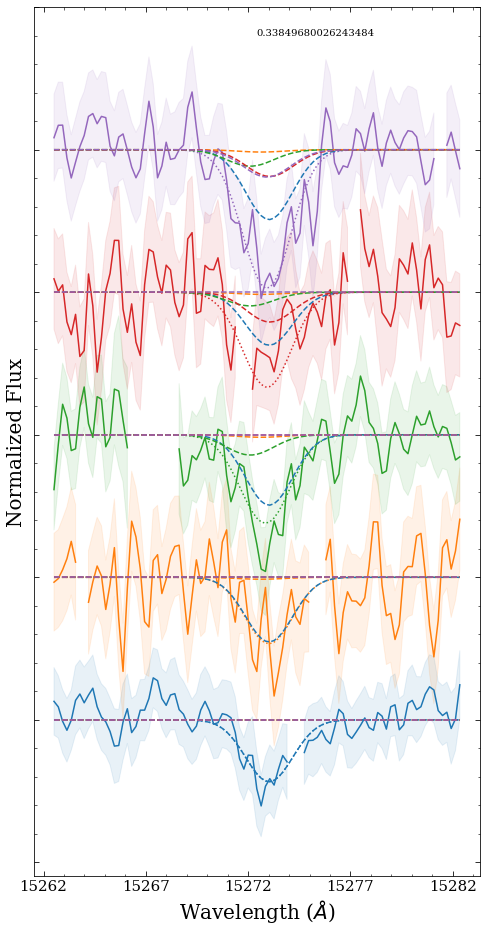

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 20
(5, 95) (5, 5, 95) (5, 5)


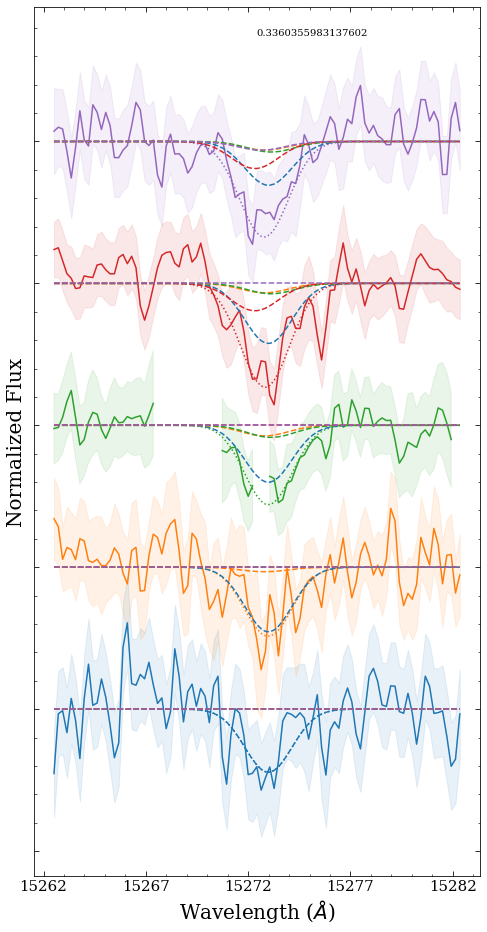

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 21
(5, 95) (5, 5, 95) (5, 5)


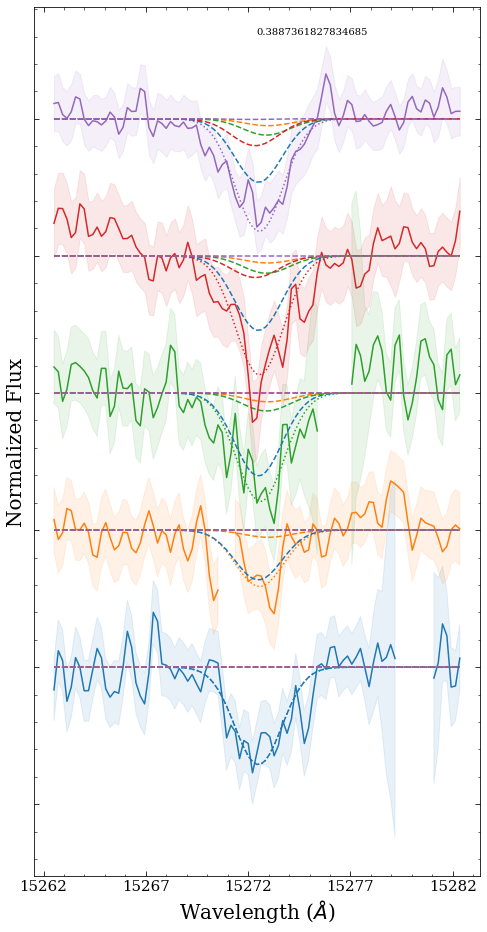

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 22
(5, 95) (5, 5, 95) (5, 5)


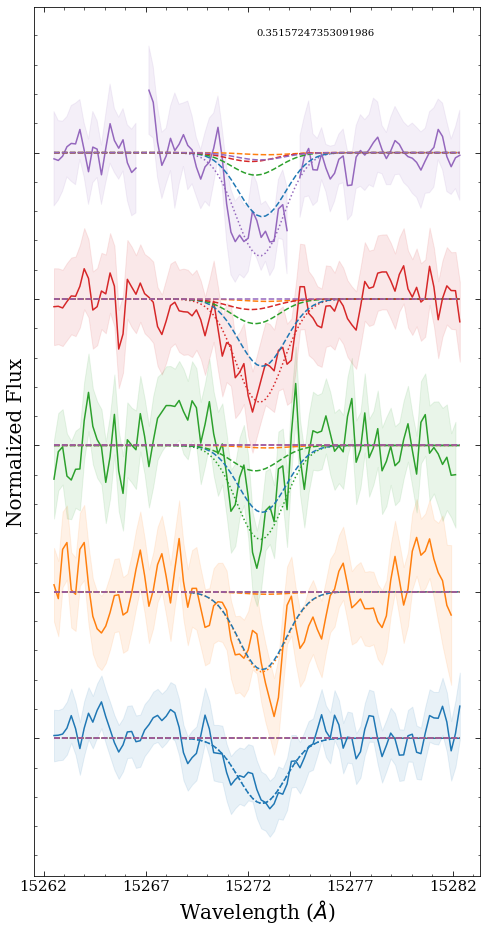

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 23
(5, 95) (5, 5, 95) (5, 5)


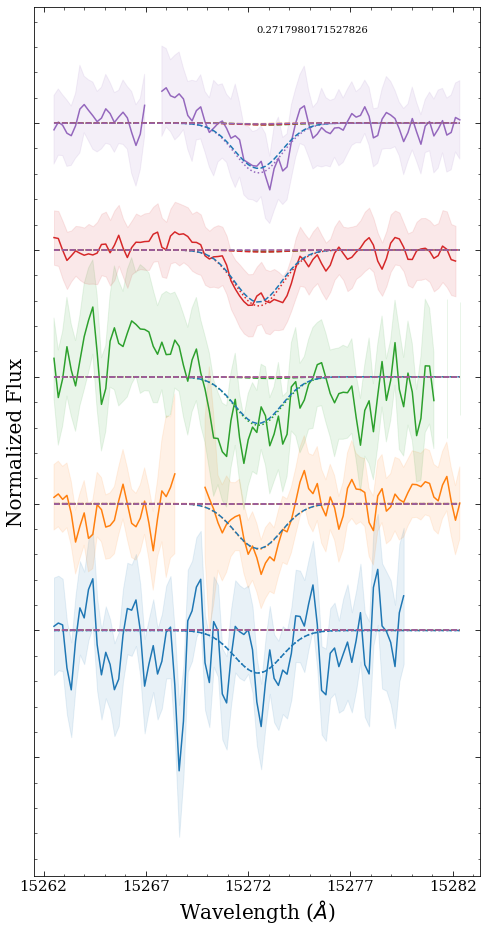

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 24
(5, 95) (5, 4, 95) (5, 4)


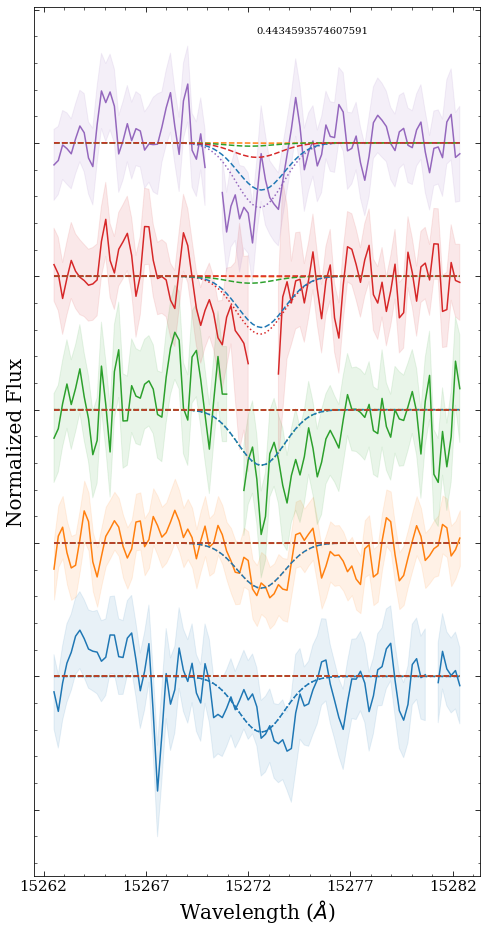

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 25
(5, 95) (5, 4, 95) (5, 4)


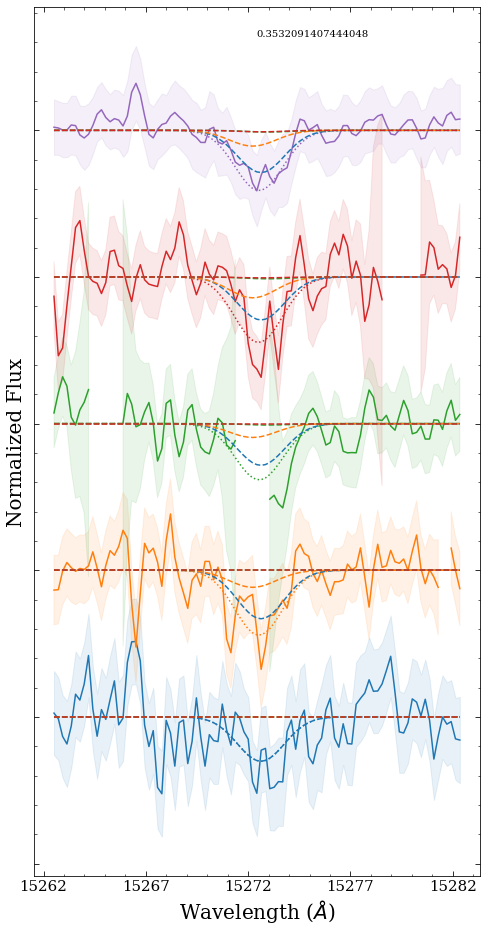

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 26
(5, 95) (5, 5, 95) (5, 5)


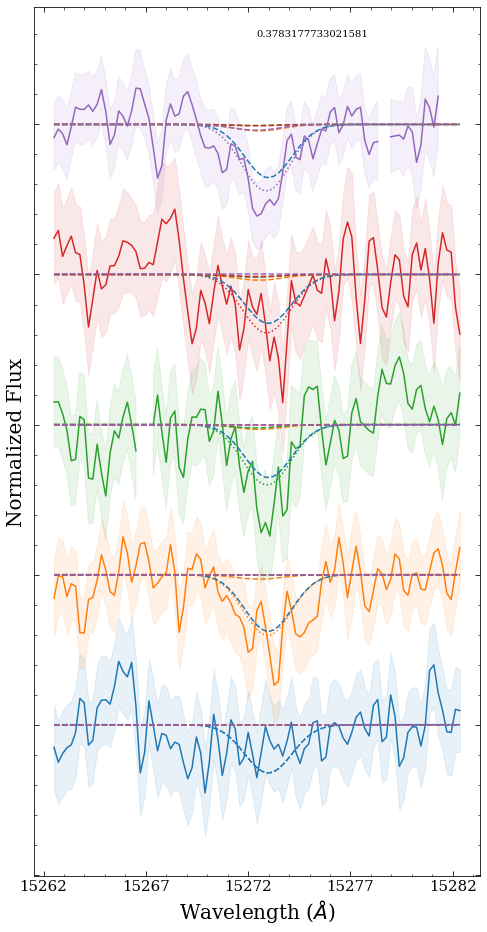

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 27
(5, 95) (5, 5, 95) (5, 5)


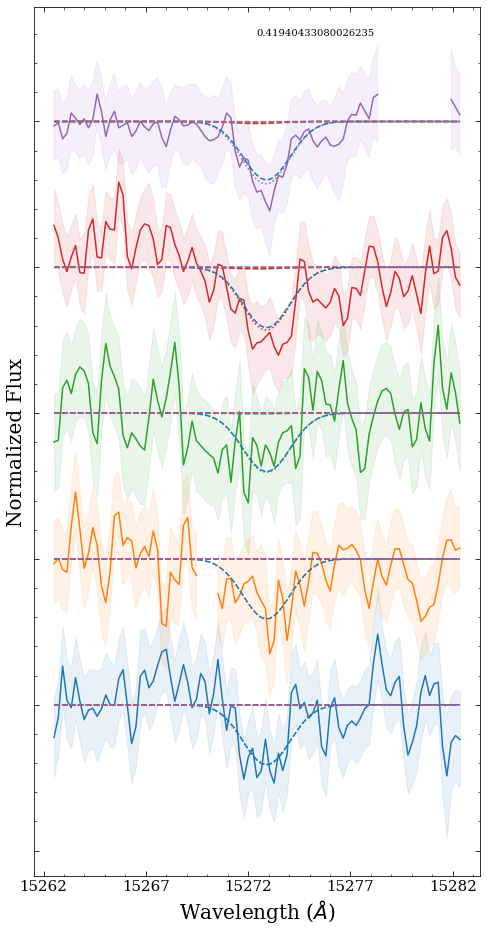

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 28
(5, 95) (5, 5, 95) (5, 5)


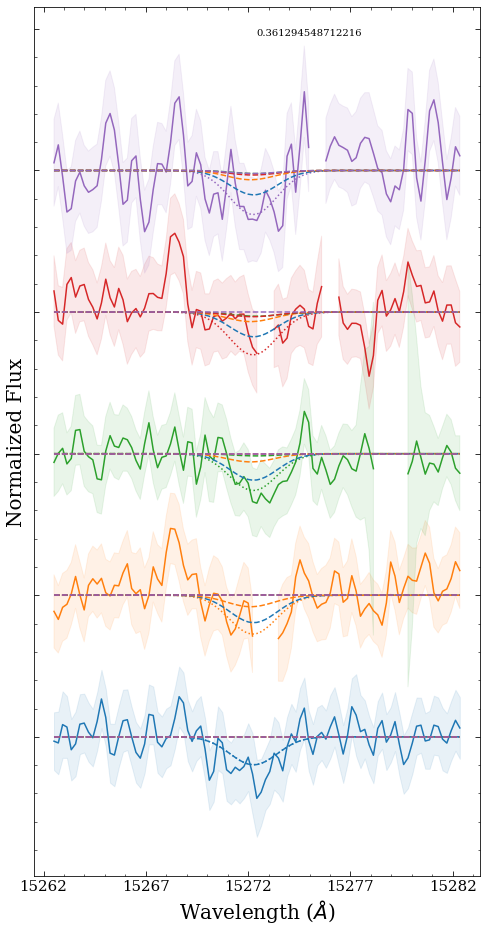

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 29
(5, 95) (5, 5, 95) (5, 5)


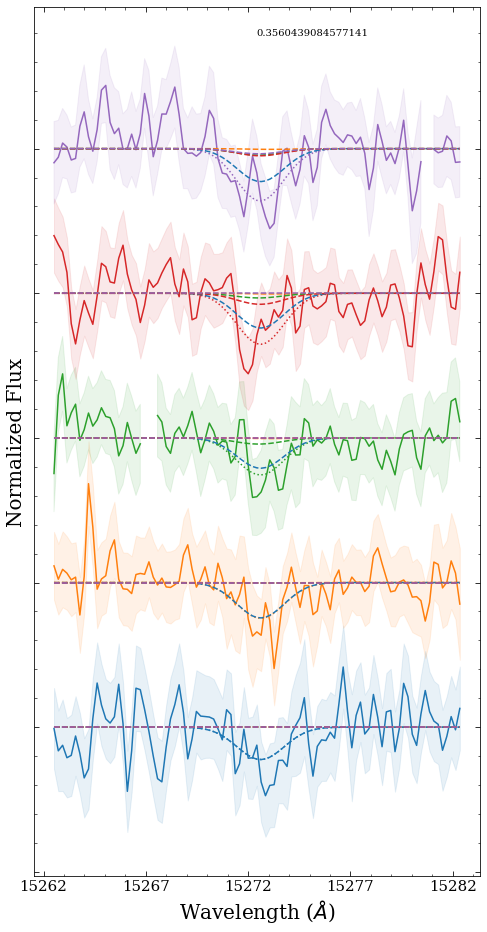

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 30
(5, 95) (5, 5, 95) (5, 5)


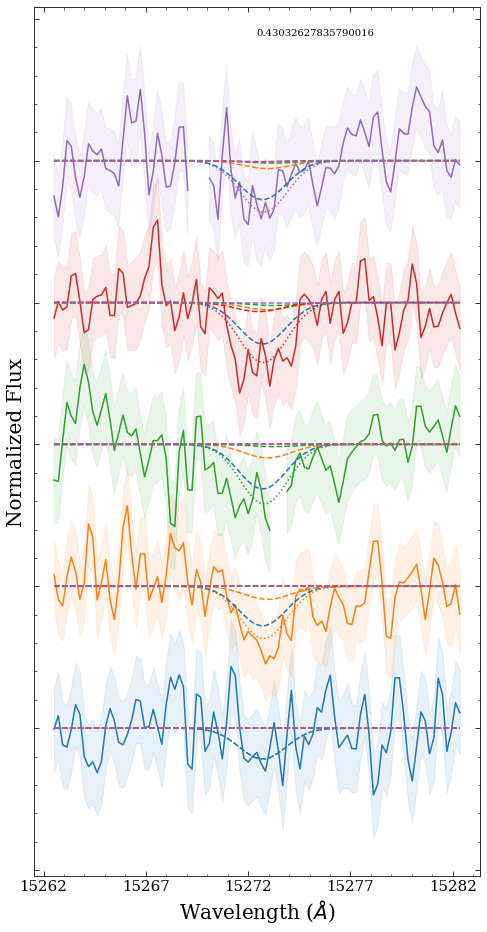

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 31
(5, 95) (5, 5, 95) (5, 5)


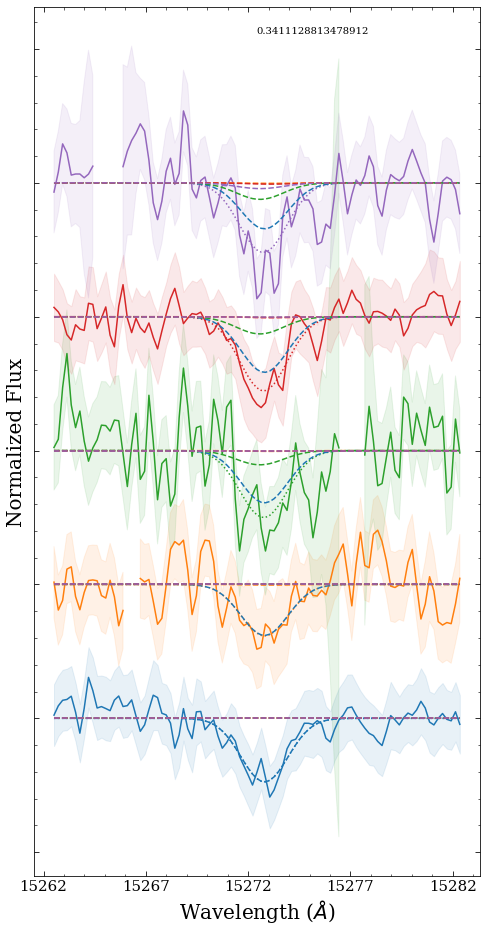

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 32
(5, 95) (5, 5, 95) (5, 5)


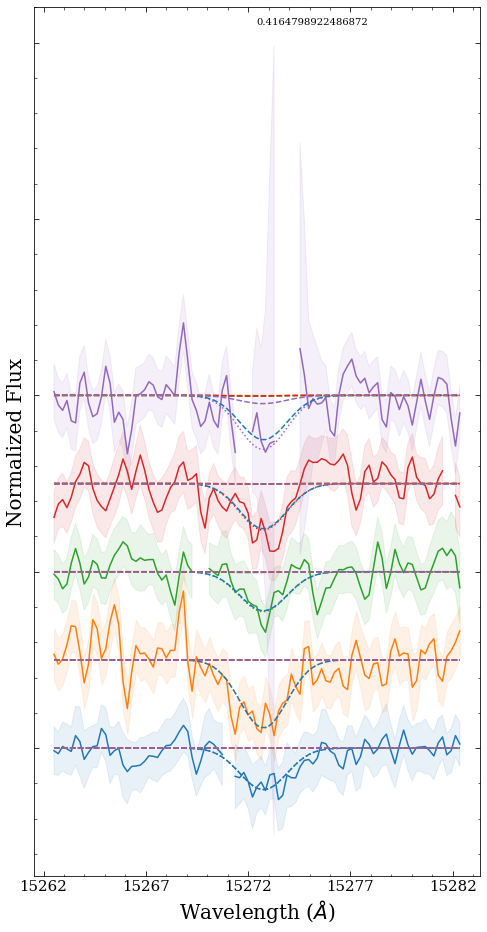

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 33
(5, 95) (5, 5, 95) (5, 5)


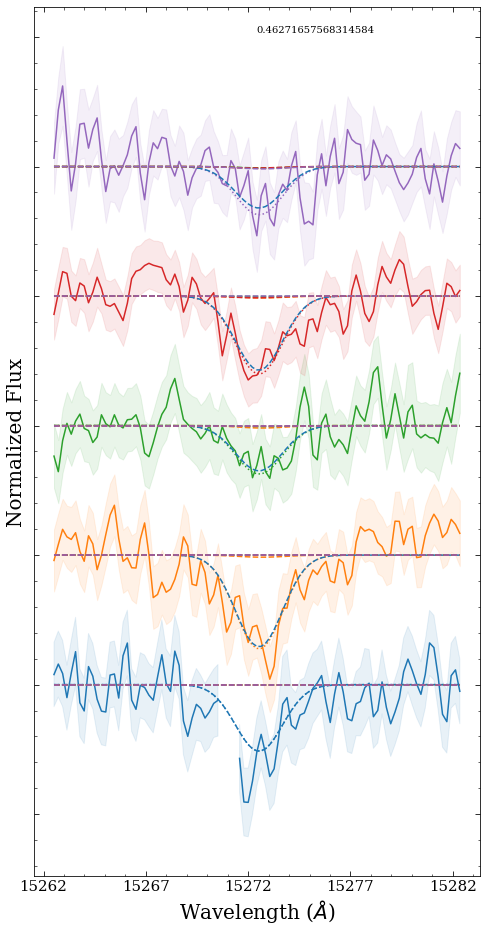

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 34
(5, 95) (5, 5, 95) (5, 5)


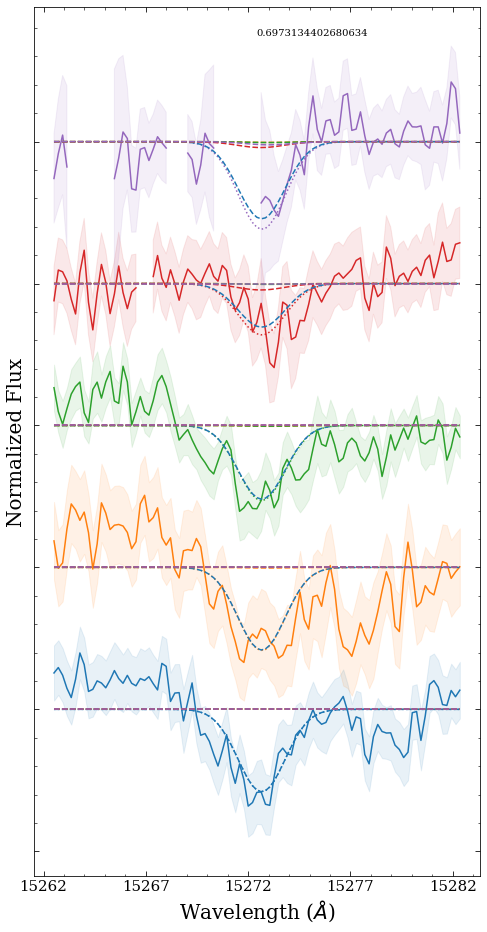

N 35


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(14, 95) (14, 10, 95) (14, 10)


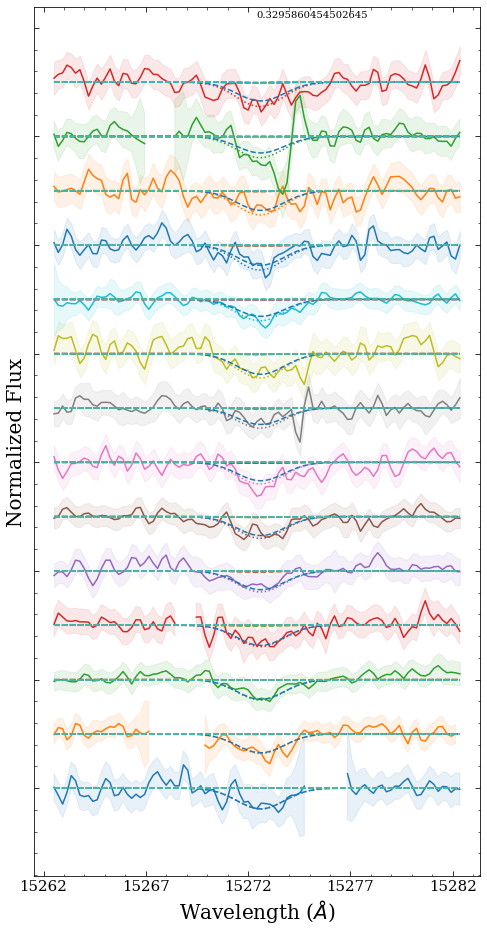

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 36
(5, 95) (5, 5, 95) (5, 5)


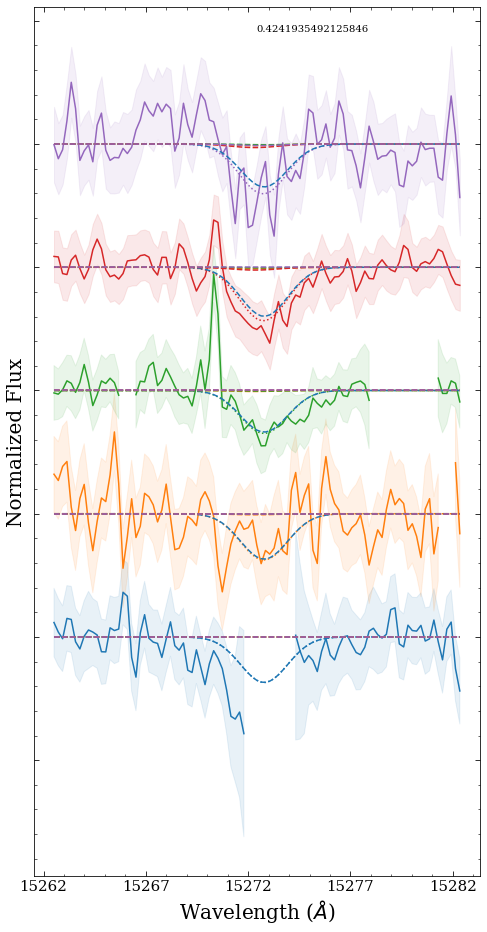

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 37
(5, 95) (5, 5, 95) (5, 5)


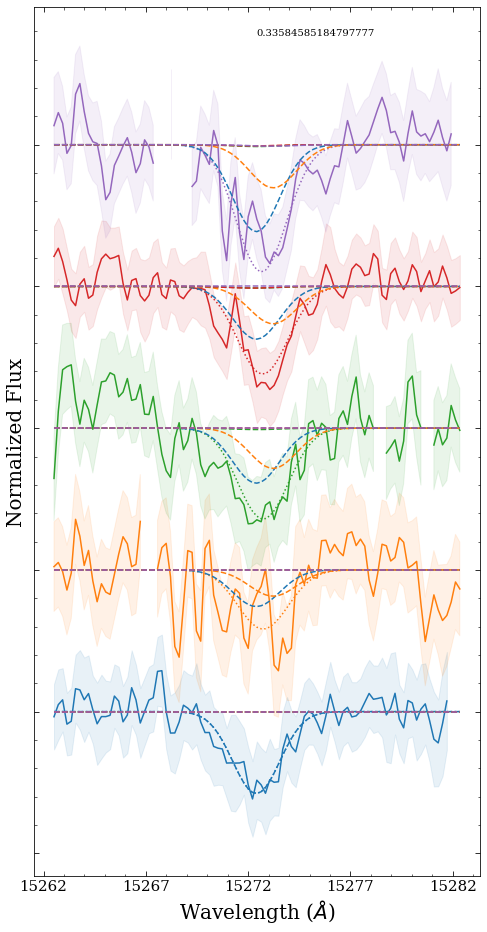

N 38
(6, 95) (6, 6, 95) (6, 6)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


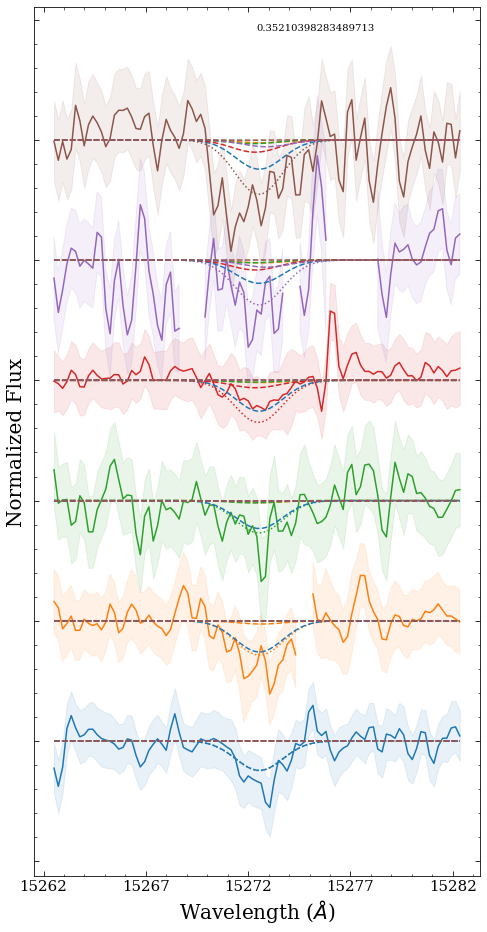

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 39
(5, 95) (5, 5, 95) (5, 5)


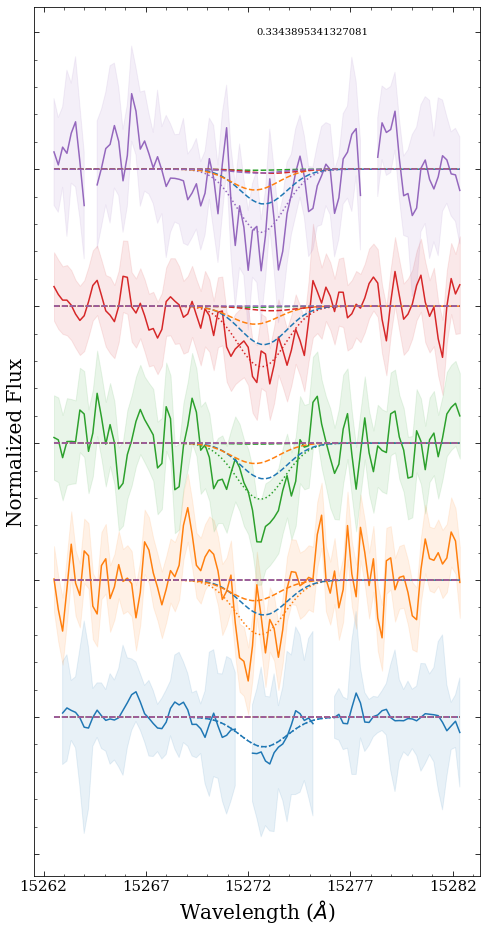

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 40
(5, 95) (5, 5, 95) (5, 5)


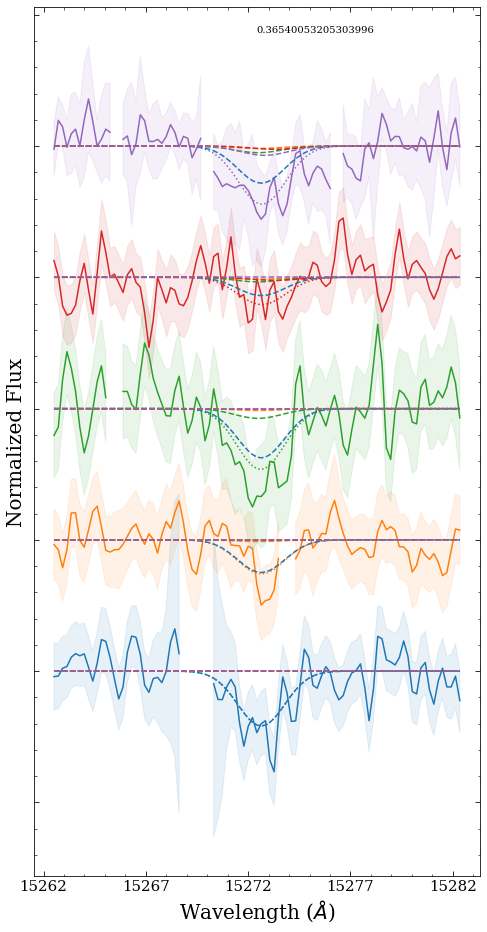

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 41
(5, 95) (5, 5, 95) (5, 5)


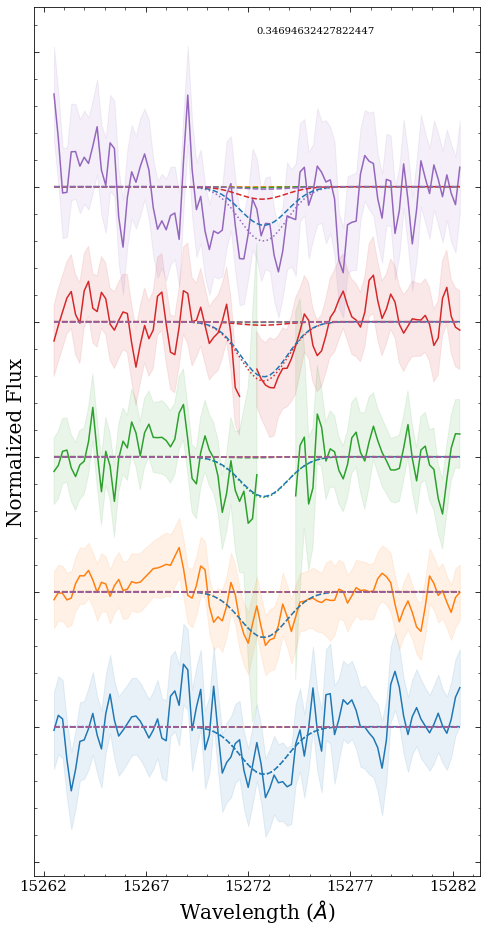

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 42
(5, 95) (5, 5, 95) (5, 5)


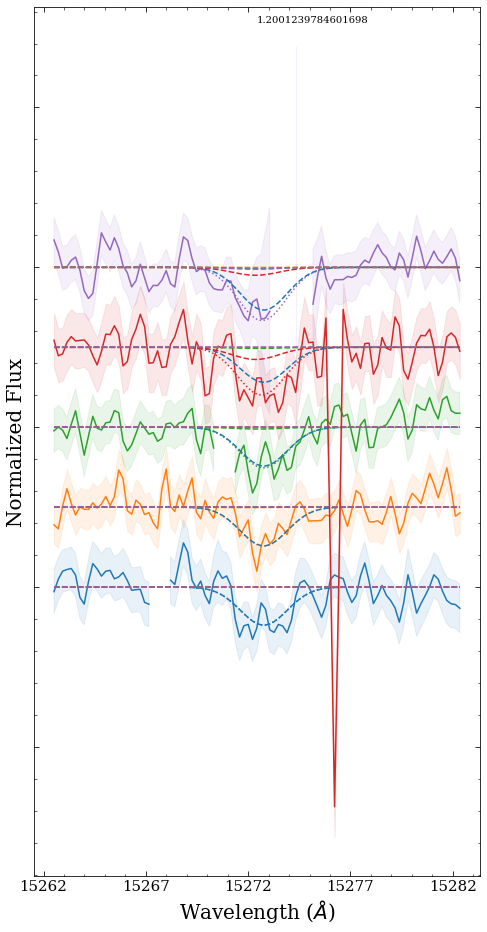

N 43
(6, 95) (6, 6, 95) (6, 6)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


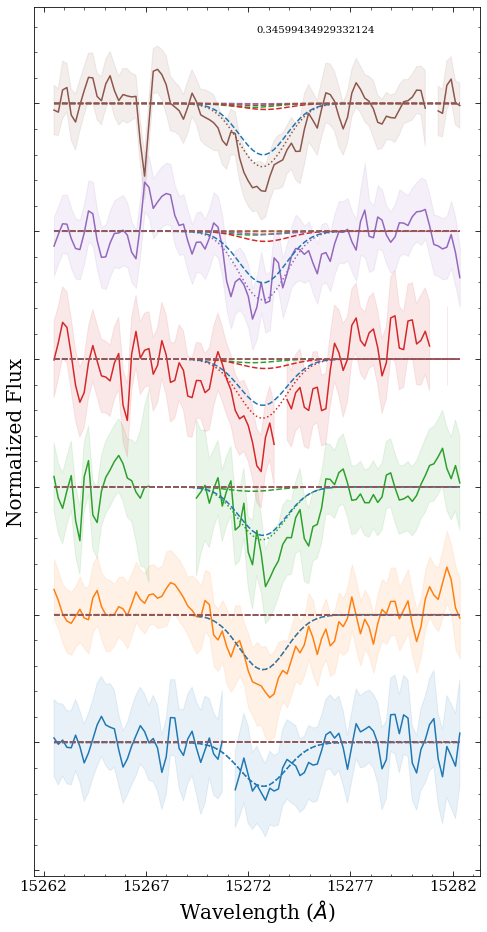

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 44
(5, 95) (5, 5, 95) (5, 5)


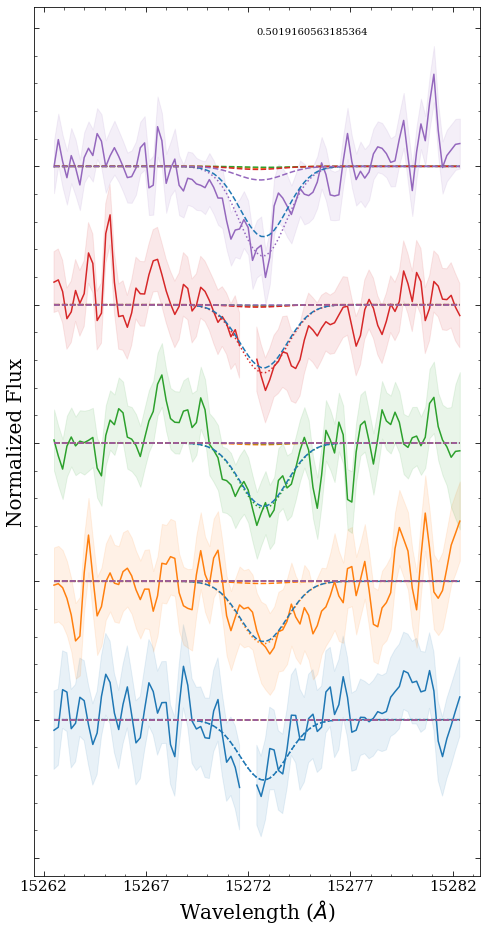

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 45
(5, 95) (5, 5, 95) (5, 5)


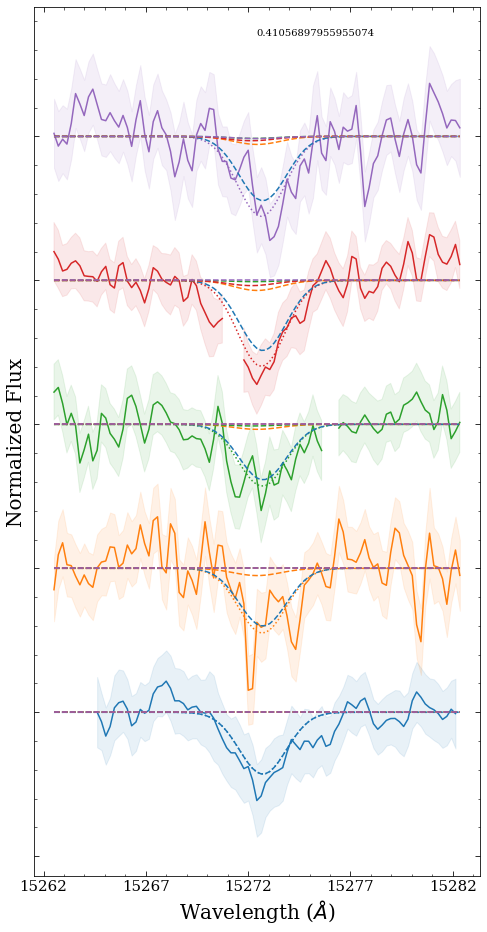

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 46
(5, 95) (5, 5, 95) (5, 5)


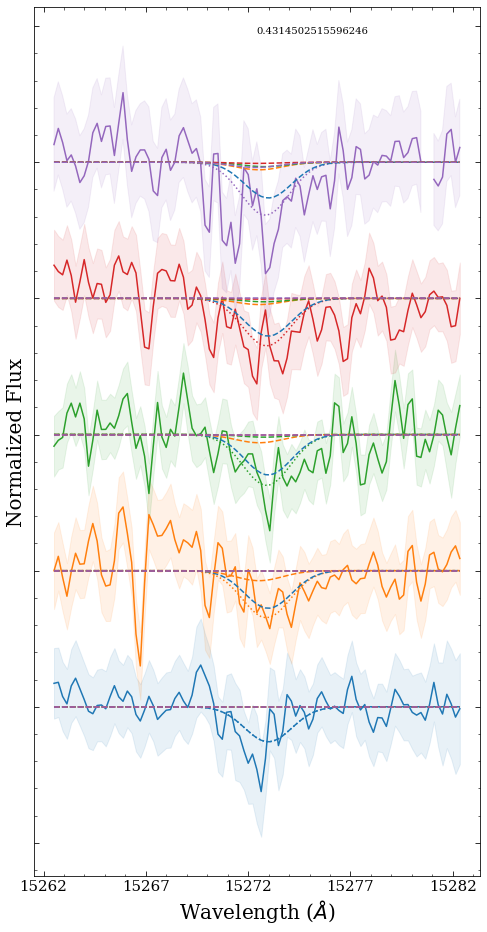

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 47
(5, 95) (5, 5, 95) (5, 5)


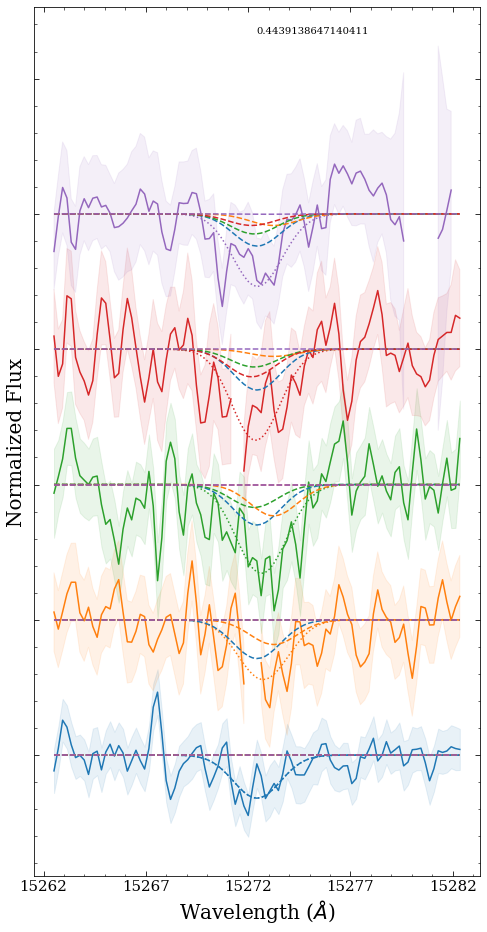

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 48
(5, 95) (5, 5, 95) (5, 5)


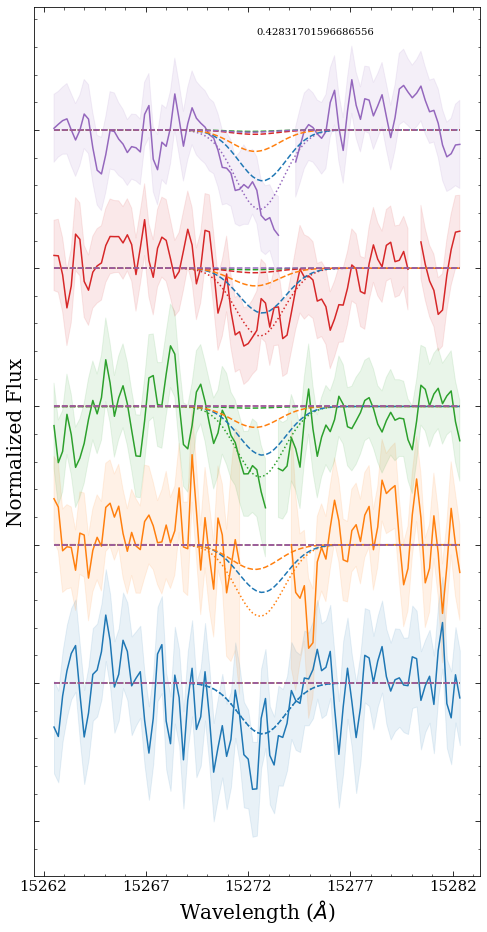

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


N 49
(5, 95) (5, 5, 95) (5, 5)


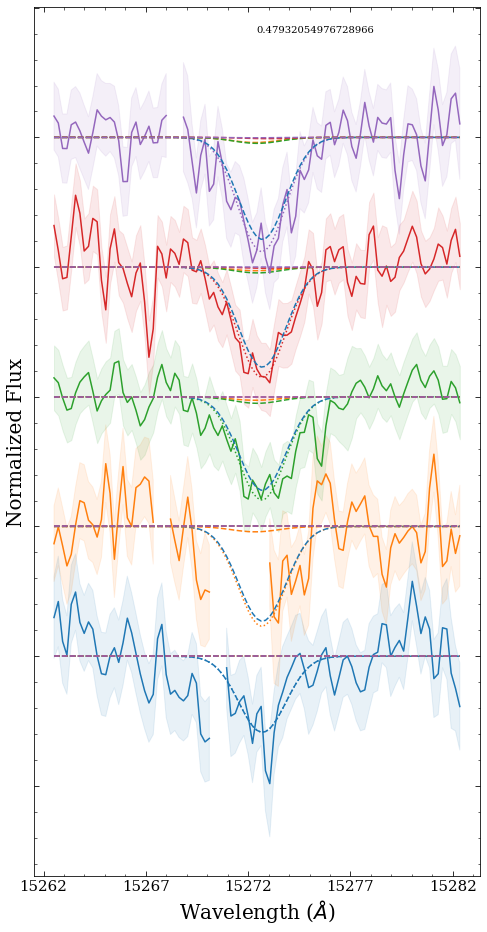

N 50
(6, 95) (6, 6, 95) (6, 6)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


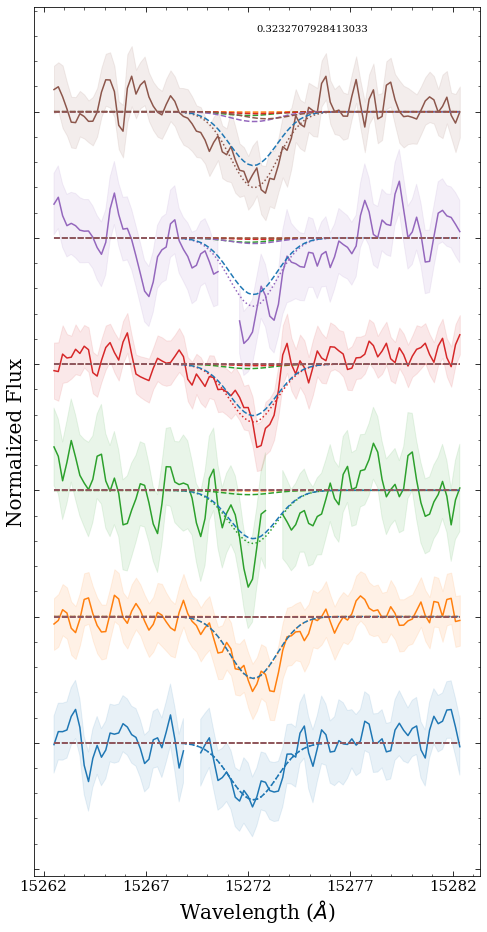

In [18]:
def model_signals_thing(rvelo, sl, dAVdd):
    # dAVdd = sl.dAVdd
    signals = np.zeros((len(sl.stars), len(wavs_window)))
    unsummed_signals = np.zeros((len(sl.stars), len(sl.bins)-1,len(wavs_window)))
    print(signals.shape, unsummed_signals.shape, sl.dAVdd.shape)
    peak_wavelength = dopplershift(rvelo)
    wavs_grid = np.tile(wavs_window, (len(sl.bins) - 1, 1))
    voxel_DIB_unscaled = np.exp(-(wavs_grid - peak_wavelength[:, np.newaxis])**2 / (2 * sigma0**2))
    amp = differentialAmplitude(dAVdd, sl.bins[1:]-sl.bins[:-1])

    def single_signal(amp, bindex):
        amp[bindex:] = 0 # THIS MIGHT NEED TO BE -1
        # print(amp)

        voxel_DIB_scaled = -voxel_DIB_unscaled *  amp[:, np.newaxis] 
        summed_DIB = np.sum(voxel_DIB_scaled, axis = 0)
        # continuum = lambda x, m, b : m * (x - lambda0) + b
        # cont = continuum(wavs_window, 0, b)
        return summed_DIB  + 1, voxel_DIB_scaled 


    for i in range(len(sl.stars)):
        star = sl.stars[i]
        dAVdd_star = dAVdd[i, :]
        # amp = Differential_Amplitude(dAVdd_star, self.bins[1:]-self.bins[:-1])
        amp = differentialAmplitude(dAVdd_star, 1)

        bin_index = sl.bin_inds[i]
        # signals[i, :] = single_signal(bin_index)
        signals[i, :], unsummed_signals[i, :, :] = single_signal(amp, bin_index)

    return signals, unsummed_signals

def plot_DIBS_thing(sampler, sl, plot_objs = None):
    if plot_objs == None:
        fig, ax = plt.subplots(figsize = (8, 16))
    else:
        fig, ax = plot_objs
    # ax.plot(wavs_window, dstack1, label = '300-480 pc')
    # ax.plot(wavs_window, dstack2, label = '480-800 pc')
    ndim = len(sl.voxel_dAVdd)
    nstars = len(sl.stars)

    samples = sampler.chain[:, :, :].reshape((-1, sampler.chain.shape[-1]))

    medians = np.nanmedian(samples[-100:, :], axis = 0)

    # med_dAV_dd = np.nanmedian(samples[50:, :], axis = 0)

    # print(medians)
    med_velo = medians[:ndim]

    med_dAV_dd = medians[ndim:].reshape(-1, ndim)
    # med_dAV_dd = np.tile(med_dAV_dd, len(sl.stars)).reshape(len(sl.stars), -1)

    order_inds = np.array(np.argsort(sl.stars['DIST']))
    # print(order_inds)

    signal_recreated, signal_recreated_unsummed = model_signals_thing(med_velo, sl, med_dAV_dd) 
    # print('sru shape ', signal_recreated_unsummed.shape)
    # for i in range(len(sl.voxel_dAVdd)):
    for i in range(len(order_inds)):
        ii = order_inds[i]
        bindex = sl.bin_index[ii]
        # signal_recreated_here = sl.model_signals(med_velo[i], dAVdd = med_dAV_dd[i, :])
        ax.plot(wavs_window, sl.signals[ii, :] + 0.05 * i, color = 'C{}'.format(i))
        ax.fill_between(wavs_window, sl.signals[ii, :] + sl.signal_errs[ii, :] + 0.05 * i,
                         sl.signals[ii, :] - sl.signal_errs[ii, :] + 0.05 * i, color = 'C{}'.format(bindex), alpha = 0.1)

        ax.plot(wavs_window, signal_recreated[ii, :] + 0.05 * i , color = 'C{}'.format(i), linestyle = 'dotted',)# label = 'recreated signal')

        for j in range(len(sl.bins)-1):
            ax.plot(wavs_window, signal_recreated_unsummed[ii, j, : ] + 1 + 0.05 * i, color='C{}'.format(j), linestyle = 'dashed', alpha = 1)

    ax.legend(loc = 'lower left', fontsize = 20)

    ax.set_xlabel('Wavelength ($\AA$)', fontsize = 20)
    ax.set_ylabel('Normalized Flux', fontsize = 20)
    fig.set_facecolor('white')

    # ax.set_xticks(np.arange(lambda0-10, lambda0 + 12, 4))
    ax.set_xticks(np.linspace(lambda0-10, lambda0 + 10, 4))

    ax.set_yticklabels('')

def plot_DIBS_freeze(sampler, plot_objs = None):
    if plot_objs == None:
        fig, ax = plt.subplots(figsize = (8, 16))
    else:
        fig, ax = plot_objs
    # ax.plot(wavs_window, dstack1, label = '300-480 pc')
    # ax.plot(wavs_window, dstack2, label = '480-800 pc')
    ndim = len(sl.voxel_dAVdd)
    nstars = len(sl.stars)

    samples = sampler.chain[:, 50:, :].reshape((-1, sampler.chain.shape[-1]))

    medians = np.nanmedian(samples[50:, :], axis = 0)

    # med_dAV_dd = np.nanmedian(samples[50:, :], axis = 0)

    # print(medians)
    med_velo = medians[:ndim]

    med_dAV_dd = medians[ndim:].reshape(-1, ndim)
    # med_dAV_dd = np.tile(med_dAV_dd, len(sl.stars)).reshape(len(sl.stars), -1)

    order_inds = np.array(np.argsort(sl.stars['DIST']))
    # print(order_inds)

    signal_recreated, signal_recreated_unsummed = model_signals_thing(med_velo, sl, med_dAV_dd) 
    # print('sru shape ', signal_recreated_unsummed.shape)
    # for i in range(len(sl.voxel_dAVdd)):
    for i in range(len(order_inds)):
        ii = order_inds[i]
        # signal_recreated_here = sl.model_signals(med_velo[i], dAVdd = med_dAV_dd[i, :])
        ax.plot(wavs_window, sl.signals[ii, :] + 0.05 * i, color = 'C{}'.format(i))
        ax.plot(wavs_window, signal_recreated[ii, :] + 0.05 * i , color = 'C{}'.format(i), linestyle = 'dotted',)# label = 'recreated signal')

        for j in range(len(sl.bins)-1):
            ax.plot(wavs_window, signal_recreated_unsummed[ii, j, : ] + 1 + 0.05 * i, color='C{}'.format(j), linestyle = 'dashed', alpha = 1)

    ax.legend(loc = 'lower left', fontsize = 20)

    ax.set_xlabel('Wavelength ($\AA$)', fontsize = 20)
    ax.set_ylabel('Normalized Flux', fontsize = 20)
    fig.set_facecolor('white')

    ax.set_xticks(np.linspace(lambda0-10, lambda0 + 10, 8))
    ax.set_yticklabels('')

def plot_DIBS_logprob(sampler, sl, plot_objs = None, bestprob = True):
    if plot_objs == None:
        fig, ax = plt.subplots(figsize = (8, 16))
    else:
        fig, ax = plot_objs
    # ax.plot(wavs_window, dstack1, label = '300-480 pc')
    # ax.plot(wavs_window, dstack2, label = '480-800 pc')
    ndim = len(sl.voxel_dAVdd)
    nstars = len(sl.stars)

    samples = sampler.chain[:, :, :].reshape((-1, sampler.chain.shape[-1]))

    medians = np.nanmedian(samples[-100:, :], axis = 0)

    # med_dAV_dd = np.nanmedian(samples[50:, :], axis = 0)

    # print(medians)

    ## NEW THING
    if bestprob:
        lp = sl_i.sampler.lnprobability
        lp[:, :-100] = -np.infty
        w_ind, stp_ind = np.unravel_index(np.argmax(lp), lp.shape)

        medians = sl_i.sampler.chain[w_ind, stp_ind, :]

    med_velo = medians[:ndim]

    med_dAV_dd = medians[ndim:].reshape(-1, ndim)
    # med_dAV_dd = np.tile(med_dAV_dd, len(sl.stars)).reshape(len(sl.stars), -1)

    order_inds = np.array(np.argsort(sl.stars['DIST']))
    # print(order_inds)

    signal_recreated, signal_recreated_unsummed = model_signals_thing(med_velo, sl, med_dAV_dd) 
    # print('sru shape ', signal_recreated_unsummed.shape)
    # for i in range(len(sl.voxel_dAVdd)):
    for i in range(len(order_inds)):
        ii = order_inds[i]
        # signal_recreated_here = sl.model_signals(med_velo[i], dAVdd = med_dAV_dd[i, :])
        ax.plot(wavs_window, sl.signals[ii, :] + 0.05 * i, color = 'C{}'.format(i))
        ax.fill_between(wavs_window, sl.signals[ii, :] + sl.signal_errs[ii, :] + 0.05 * i,
                         sl.signals[ii, :] - sl.signal_errs[ii, :] + 0.05 * i, color = 'C{}'.format(i), alpha = 0.1)

        ax.plot(wavs_window, signal_recreated[ii, :] + 0.05 * i , color = 'C{}'.format(i), linestyle = 'dotted',)# label = 'recreated signal')

        for j in range(len(sl.bins)-1):
            ax.plot(wavs_window, signal_recreated_unsummed[ii, j, : ] + 1 + 0.05 * i, color='C{}'.format(j), linestyle = 'dashed', alpha = 1)

    ax.legend(loc = 'lower left', fontsize = 20)

    ax.set_xlabel('Wavelength ($\AA$)', fontsize = 20)
    ax.set_ylabel('Normalized Flux', fontsize = 20)
    fig.set_facecolor('white')

    # ax.set_xticks(np.arange(lambda0-10, lambda0 + 12, 4))
    ax.set_xticks(np.linspace(15272-10, 15272 + 10, 5))

    ax.set_yticklabels('')

    return signal_recreated, sl.signals, sl.signal_errs

chi2s = np.zeros(len(sightlines))
sl_lensignals = np.zeros(len(sightlines))
for i in range(len(sightlines)):
    print('N', i)
    fig, ax = plt.subplots(figsize = (8, 16))

    sl_i = sightlines[i]
    sl_lensignals[i] = sl_i.nsig
    sampler_i = sl_i.sampler
    reproducedDIBs, realDIBs, realDIBerrs = plot_DIBS_logprob(sampler_i, sl_i, plot_objs = (fig, ax))

    chi2 = np.nansum((realDIBs-reproducedDIBs)**2 / realDIBerrs**2) / np.sum(np.isnan(realDIBs) == False)
    chi2s[i] = chi2

    ymin, ymax = ax.get_ylim()
    ax.text(lambda0, ymax - .01, str(chi2))

    lp_i = sampler_i.lnprobability
    lp_med_i = np.nanmedian(lp_i[:, -100:])
    # ax.text(lambda0, ymax - .01, 'sl index {}'.format(i) )
    # ax.text(lambda0, ymax - .015, 'lnprob {}'.format(lp_med_i) )

    name_i = 'dibs_' + str(i)
    # fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/231015_DIBmodels/{}.png'.format(name_i), overwrite = True)

    plt.show()




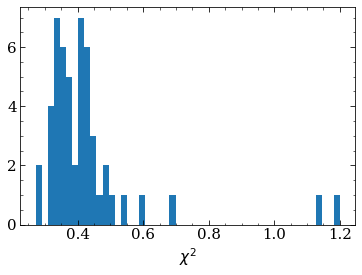

In [19]:
fig, ax = plt.subplots()
ax.hist(chi2s, bins = 50)
ax.set_xlabel('$\chi^2$')
plt.show()

In [20]:
sl_davdd = np.zeros((len(l_sample.flatten()), dust_data.dustmap.shape[-1]))
for i in range(len(l_sample.flatten())): 
    l_i, b_i = l_sample.flatten()[i], b_sample.flatten()[i]
    l_ind, b_ind = find_nearest(l_i, b_i)
    sl_davdd[i, :] = np.copy(dust_data.dustmap[b_ind, l_ind, :])

In [21]:
def plot_velo(sampler, sl , min_walker = None, plot_objs = None, color = None, plot_lines = False, plot_box = False, plot_violin = False, bestprob = False,):
    if plot_objs == None:
        fig, ax = plt.subplots(figsize = (8,6))
    else:
        fig, ax = plot_objs
    # ax.plot(wavs_window, dstack1, label = '300-480 pc')
    # ax.plot(wavs_window, dstack2, label = '480-800 pc')
    ndim = len(sl.voxel_dAVdd)

    walker_max = sampler.chain.shape[1]

    if min_walker is None:
        min_walker_val = -100
    # else:
    min_walker_val = walker_max - min_walker

    samples = sampler.chain[:, min_walker_val:, :].reshape((-1, sampler.chain.shape[-1]))

    # vel_samples = sampler.chain[:, min_walker_val, :].reshape((-1, sl.ndim))
    vel_samples = samples[:, :sl.ndim]
    avg_av = np.nansum(np.median(sl.dAVdd, axis = 0))

    


    medians = np.nanmedian(samples[min_walker_val:, :], axis = 0)
    if bestprob:
        lp = sl_i.sampler.lnprobability
        lp[:, :-100] = -np.infty
        w_ind, stp_ind = np.unravel_index(np.argmax(lp), lp.shape)

        medians = sl_i.sampler.chain[w_ind, stp_ind, :]

    stdevs = np.nanstd(samples[min_walker_val:, :], ddof = 1, axis = 0)

    med_velo = medians[:ndim]
    std_velo = stdevs[:ndim]


    med_dAV_dd = medians[ndim:]
    med_dAV_dd = stdevs[ndim:]

    perc16, perc50,  perc84 = (np.percentile(samples[min_walker_val:, :], 16, axis = 0), 
                               np.percentile(samples[min_walker_val:, :], 50, axis = 0),
                               np.percentile(samples[min_walker_val:, :], 84, axis = 0) )
    velo16, velo50, velo84 = (perc16[:ndim], perc50[:ndim], perc84[:ndim])

    # med_dAV_dd = np.tile(med_dAV_dd, len(sl.stars)).reshape(len(sl.stars), -1)


    # ax.scatter((a.bins[1:] + a.bins[:-1] ) /2 , med_velo)
    # if
    # for i in range(len(sl.bins)-1): 
    #     ax.hlines(med_velo[i], sl.bins[i], sl.bins[i+1], linestyle = 'dashed')
    #     if i < len(sl.bins) -2:
    #         ax.vlines(sl.bins[i+1], med_velo[i], med_velo[i+1], linestyle = 'dashed')

    if color == None:
        color_choice = 'k'
    else:
        color_choice = color
    

    if plot_box:
        # ax.hlines(med_velo, sl.bins[:-1], sl.bins[1:], color = color_choice, linestyle = 'dashed', linewidth = 0.5)
        # ax.hlines(velo50, sl.bins[:-1], sl.bins[1:], color = color_choice)
        ax.hlines(velo50, sl.bins[:-1], sl.bins[1:], color = 'k')


        for j in range(len(sl.bins)-1):
            # ax.fill_between([sl.bins[i], sl.bins[i +1]], med_velo[i]+std_velo[i], med_velo[i]-std_velo[i], 
            #                 alpha = 0.3, color = color_choice, hatch = '/')
            ax.fill_between([sl.bins[j], sl.bins[j +1]], velo84[j], velo16[j], 
                    alpha = 0.3, color = 'C{}'.format(j))

        if plot_violin:
            
            pos = (sl.bins[1:] + sl.bins[:-1])/2
            w = (sl.bins[1:] - sl.bins[:-1])
            ax.violinplot(vel_samples, pos, widths = w, showmeans=True, showextrema=False, showmedians=True)



    else:  
        # ax.errorbar((sl.bins[1:] + sl.bins[:-1] ) /2 , med_velo, yerr = std_velo, fmt = '.', color = color_choice, capsize = 5)
        # ax.scatter((sl.bins[1:] + sl.bins[:-1] ) /2 , med_velo, c = color_choice)
        ax.errorbar((sl.bins[1:] ) , med_velo, yerr = std_velo, fmt = '.', color = color_choice, capsize = 5)
        ax.scatter((sl.bins[1:] ) , med_velo, c = color_choice)
        if plot_lines:
            ax.hlines(med_velo, sl.bins[:-1], sl.bins[1:], color = color_choice, linestyle = 'solid', linewidth = .5)



    # ax.errorbar((sl.bins[1:]),med_velo, xerr = (sl.bins[1:] - sl.bins[:-1], np.zeros(med_velo.shape)), yerr = std_velo, fmt = '.' )
    ax.set_xlim(350, 600)
    ax.set_xlabel('Distance (pc)')
    ax.set_ylabel('Radial Velocity (km/s)')

    dist_xx = (sl.bins[1:] + sl.bins[:-1] ) /2
    # med_velo

    return fig, ax, dist_xx, med_velo, std_velo


N  0
[ 78.93037415 288.17993164 472.06390381 547.76434326 577.60766602]
[10.05081694  3.51505509 -3.15018253  2.44212292  0.25710285]
[472.06390381 547.76434326 577.60766602]
(array([  0.04191852, -22.52656632]), array([[ 8.81856605e-04, -4.63709308e-01],
       [-4.63709308e-01,  2.45700213e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


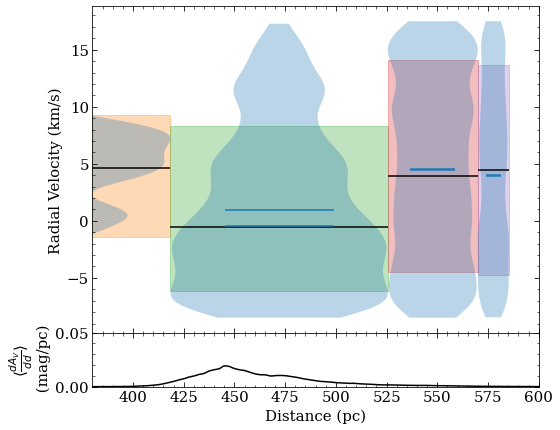

N  1
[219.78427124 455.03808594 475.51266479 485.52267456 507.90985107]
[14.05454013 -5.03662188 -0.31781212  3.92084366 -6.05799462]
[455.03808594 475.51266479 485.52267456 507.90985107]
(array([-0.00573183,  0.87020556]), array([[ 2.19905829e-02, -1.05755917e+01],
       [-1.05755917e+01,  5.09406910e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


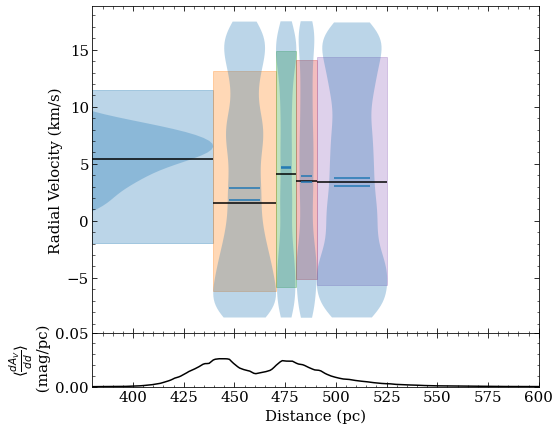

N  2
[201.79954529 408.60409546 446.96191406 495.33456421 543.1262207 ]
[ 7.93706091  2.88473359  4.17257325 -6.37658718 10.40017173]
[408.60409546 446.96191406 495.33456421 543.1262207 ]
(array([ 0.02621681, -9.26168391]), array([[ 6.58656622e-03, -3.09832413e+00],
       [-3.09832413e+00,  1.47200195e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


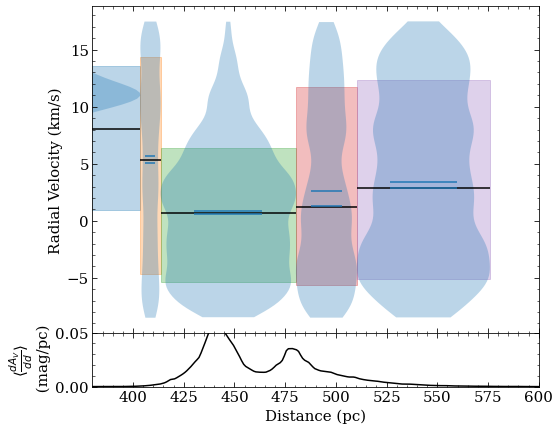

N  3
[200.25393677 425.71636963 468.37747192 511.1282959  589.63739014]
[-6.61767763 11.66162138 -6.50901007 11.87632933  2.07247694]
[425.71636963 468.37747192 511.1282959  589.63739014]
(array([-0.02187272, 15.91485804]), array([[ 7.73393471e-03, -3.85901643e+00],
       [-3.85901643e+00,  1.95344676e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


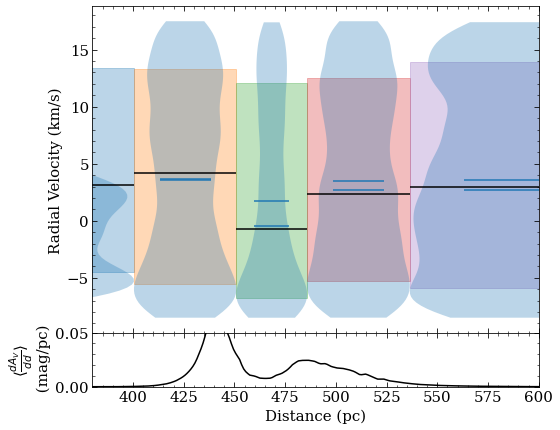

N  4
[210.72927856 426.46356201 437.93457031 496.68527222 561.67285156]
[ 5.21068432 -4.42226308 15.39659365 -4.72362424 -6.5886912 ]
[426.46356201 437.93457031 496.68527222 561.67285156]
(array([-0.09064141, 42.59355223]), array([[ 9.96025773e-03, -4.83123321e+00],
       [-4.83123321e+00,  2.36565464e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


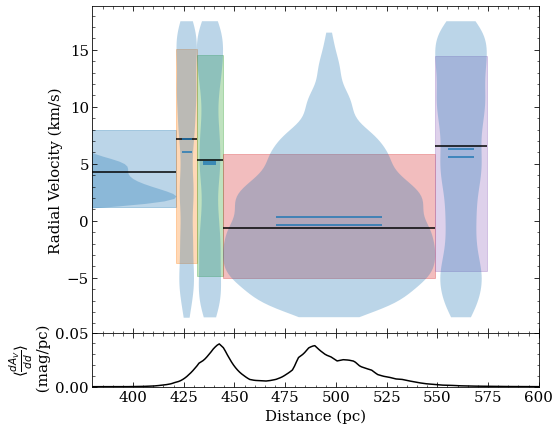

N  5
[203.15335083 422.27020264 444.5123291  478.56817627 546.32177734]
[ 0.58543706  7.18682924  4.67617407 -5.21603771 -0.95112436]
[422.27020264 444.5123291  478.56817627 546.32177734]
(array([-0.06904975, 33.89401634]), array([[ 3.27821870e-03, -1.54943752e+00],
       [-1.54943752e+00,  7.39395238e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


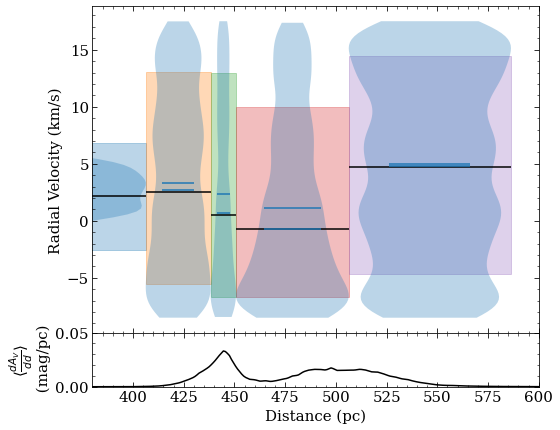

N  6
[194.556427   436.07519531 488.04251099 519.3347168  557.64611816]
[ 4.3369108  10.66991605 -4.96004944 -6.07171124  6.45682213]
[436.07519531 488.04251099 519.3347168  557.64611816]
(array([-0.03948026, 20.9665191 ]), array([[ 1.26617458e-02, -6.35550048e+00],
       [-6.35550048e+00,  3.21399073e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


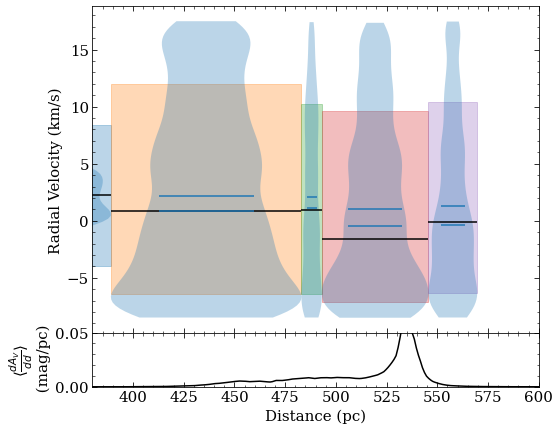

N  7
[206.06762695 453.89193726 500.65362549 515.43652344 558.07305908]
[-1.879416   -4.83836769 10.27648439  3.0558446  12.53235982]
[453.89193726 500.65362549 515.43652344 558.07305908]
(array([  0.16699724, -79.83028944]), array([[ 3.02383898e-03, -1.48841763e+00],
       [-1.48841763e+00,  7.37414926e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


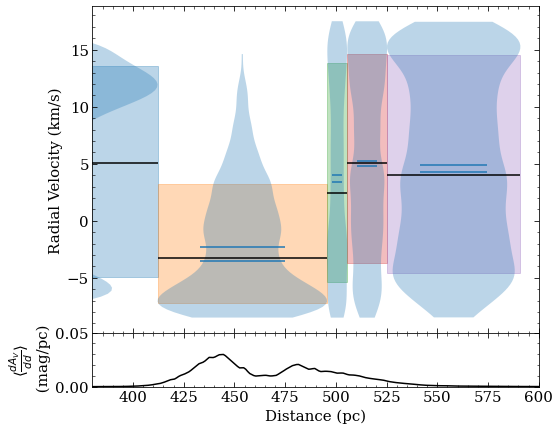

N  8
[207.2645874  419.53417969 451.1105957  518.91821289]
[ 0.55244756 11.93481161  1.50047892  4.7182556 ]
[419.53417969 451.1105957  518.91821289]
(array([-0.04981606, 29.03404398]), array([[ 8.05294931e-03, -3.74814552e+00],
       [-3.74814552e+00,  1.75846521e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


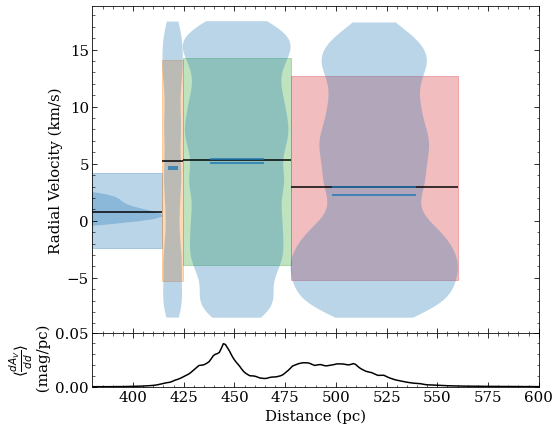

N  9
[ 62.57159424 275.65478516 456.00408936 500.40039062 559.28851318]
[16.44745033 -8.34252605 16.83031257 -4.93119362 -8.02758503]
[456.00408936 500.40039062 559.28851318]
(array([ -0.23827379, 121.98571649]), array([[ 1.42170701e-02, -7.13267374e+00],
       [-7.13267374e+00,  3.60448831e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


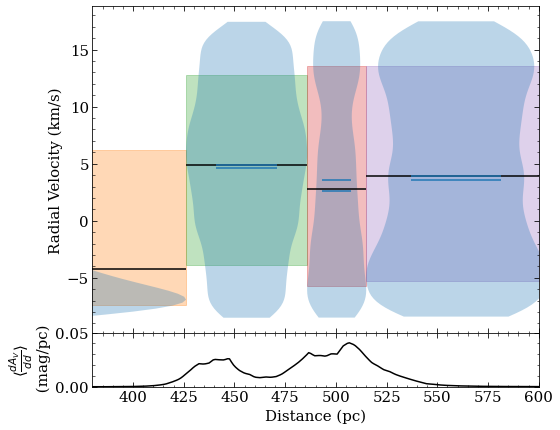

N  10
[125.85613251 327.66207886 424.19592285 457.88537598 486.15039062
 515.6151123  534.92529297]
[ 8.220397    9.27715296 -6.63199248  0.3728773  -7.80422221 -1.38048837
  5.60380561]
[424.19592285 457.88537598 486.15039062 515.6151123  534.92529297]
(array([  0.07592163, -38.8560201 ]), array([[ 3.32338154e-03, -1.61376409e+00],
       [-1.61376409e+00,  7.88524927e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


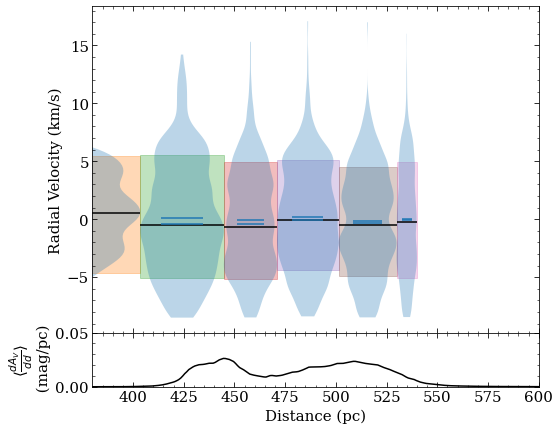

N  11
[187.08995056 391.30517578 429.85888672 456.29232788 481.21447754]
[ 6.64327903 14.15490203  3.13319402 11.57009413  2.96949515]
[391.30517578 429.85888672 456.29232788 481.21447754]
(array([-0.08891617, 46.77856092]), array([[ 7.46935448e-03, -3.28905908e+00],
       [-3.28905908e+00,  1.45638826e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


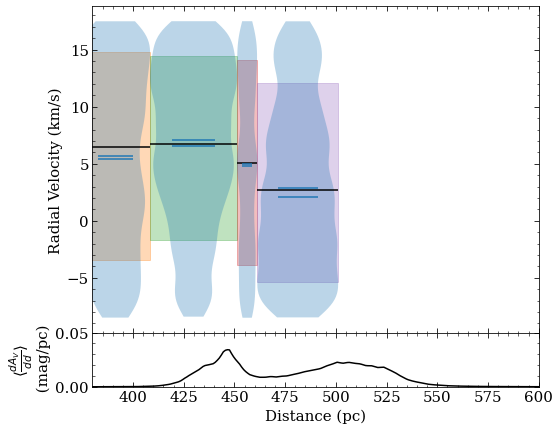

N  12
[206.30764771 417.62030029 429.65344238 474.24975586 516.82293701]
[ 9.744333   10.77311043 -0.45759107 -3.90183138 -6.80074912]
[417.62030029 429.65344238 474.24975586 516.82293701]
(array([-0.14681962, 67.37196966]), array([[ 4.13320363e-03, -1.90075565e+00],
       [-1.90075565e+00,  8.80208611e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


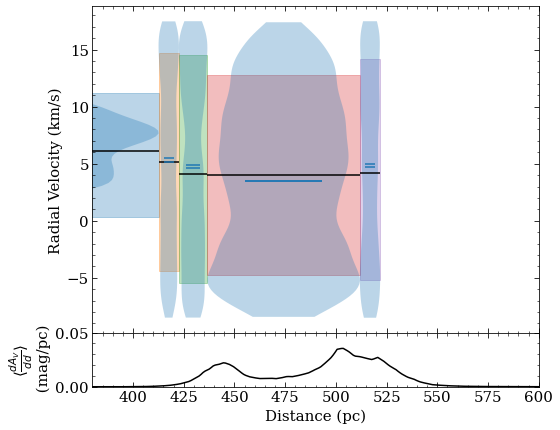

N  13
[199.62854004 404.26208496 431.84075928 459.71051025 490.29187012]
[ 4.6116126  -0.77240176 -6.77642132 11.2189323  -5.31232224]
[404.26208496 431.84075928 459.71051025 490.29187012]
(array([ 0.0061605, -3.306968 ]), array([[ 2.36178298e-02, -1.05718841e+01],
       [-1.05718841e+01,  4.75684243e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


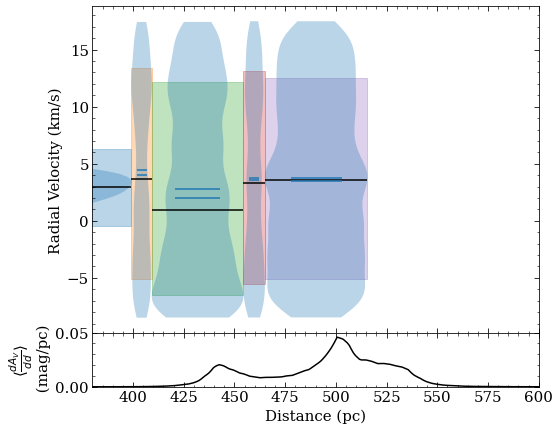

N  14
[217.67939758 443.95129395 473.13568115 501.97814941 716.83312988]
[10.43756761 14.82372203 -5.68009475 16.3745152  12.17029537]
[443.95129395 473.13568115 501.97814941]
(array([ 0.021048  , -1.76257596]), array([[ 1.87223702e-01, -8.85034305e+01],
       [-8.85034305e+01,  4.19396456e+04]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


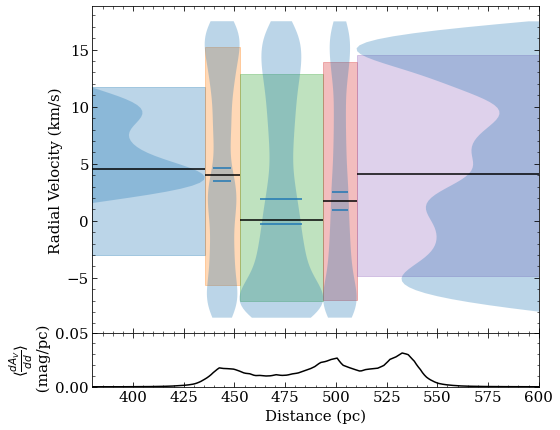

N  15
[232.68962097 486.27062988 512.16699219 528.04241943 548.66113281]
[ 5.9346995  -7.94644378 -4.22150335 -2.29444532 15.97595963]
[486.27062988 512.16699219 528.04241943 548.66113281]
(array([   0.37770192, -195.79735919]), array([[ 2.05075021e-02, -1.07014323e+01],
       [-1.07014323e+01,  5.59422495e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


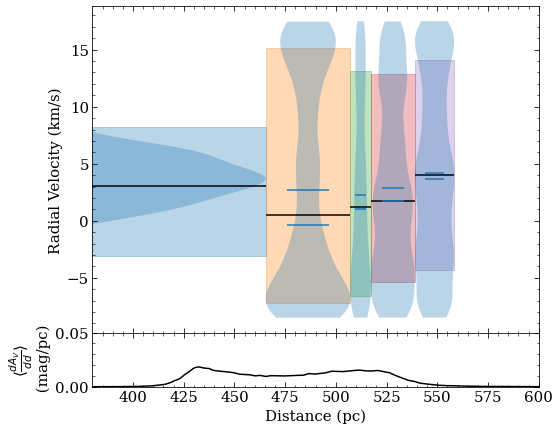

N  16
[211.82312012 432.46484375 498.61877441 560.95910645 585.37658691]
[-5.2677767   3.21935508 12.64503817  1.1312114   6.4349943 ]
[432.46484375 498.61877441 560.95910645 585.37658691]
(array([-1.28388270e-02,  1.34604424e+01]), array([[ 3.62716118e-03, -1.87649048e+00],
       [-1.87649048e+00,  9.81658383e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


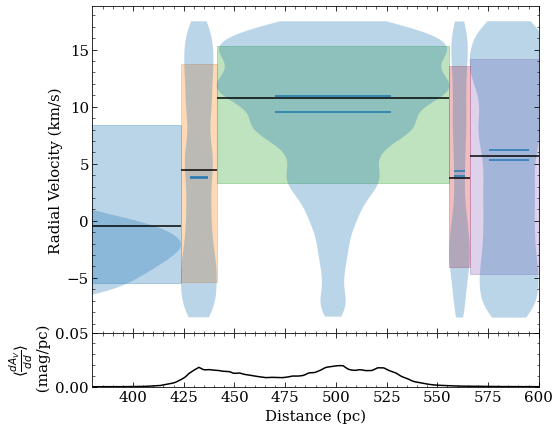

N  17
[204.37934875 433.19073486 468.50146484 484.38519287 494.39520264
 504.4052124  577.1652832 ]
[ 7.70276074  0.49967077  3.06234709 -3.88094104 -7.93915635  0.59953386
 -4.81070154]
[433.19073486 468.50146484 484.38519287 494.39520264 504.4052124
 577.1652832 ]
(array([-0.04105224, 18.25853544]), array([[ 1.53843193e-03, -7.58989256e-01],
       [-7.58989256e-01,  3.77207060e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


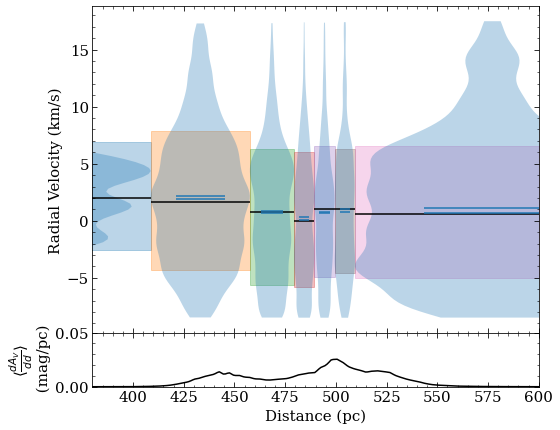

N  18
[221.04829407 447.10159302 457.11160278 467.12161255 486.02459717
 515.96722412]
[ 6.07814929 -1.47207477 -1.91939227 -1.71623237 10.96114326  0.04492076]
[447.10159302 457.11160278 467.12161255 486.02459717 515.96722412]
(array([  0.07339336, -33.55737397]), array([[ 1.19177139e-02, -5.65253843e+00],
       [-5.65253843e+00,  2.68818185e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


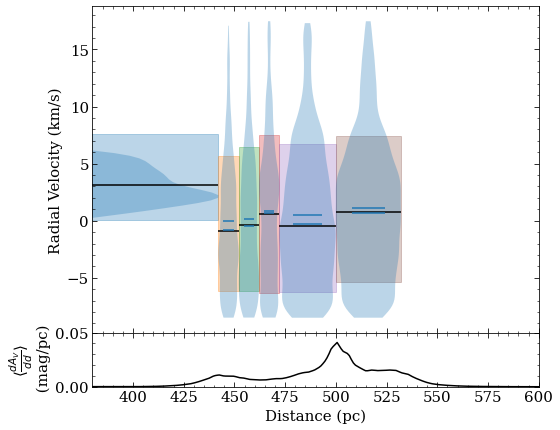

N  19
[202.04191589 418.2321167  448.89007568 484.45513916 536.98840332]
[11.93323033  4.10086258 -6.20399089 12.60608751  9.71838756]
[418.2321167  448.89007568 484.45513916 536.98840332]
(array([  0.08809554, -36.3927604 ]), array([[ 8.90067030e-03, -4.18907191e+00],
       [-4.18907191e+00,  1.98905774e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


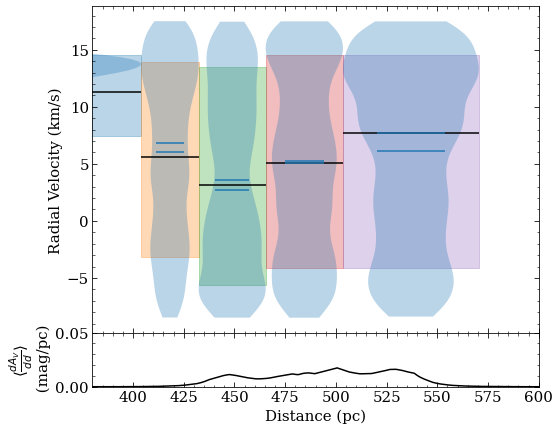

N  20
[225.64433289 459.79754639 473.81481934 495.38500977 535.07519531]
[11.21062044  7.59505081 13.85602885 -1.71575278  4.49551211]
[459.79754639 473.81481934 495.38500977 535.07519531]
(array([-0.08999393, 50.38565564]), array([[ 1.57374831e-02, -7.72568463e+00],
       [-7.72568463e+00,  3.80528082e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


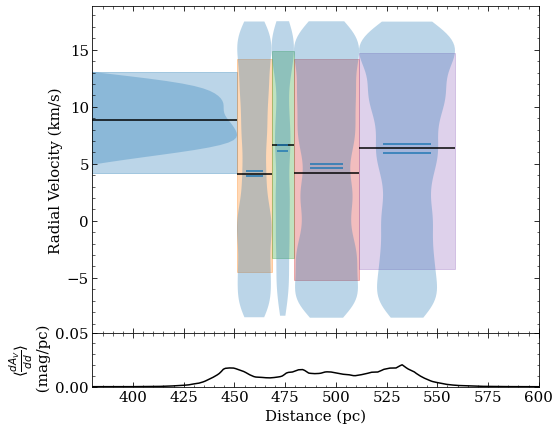

N  21
[249.84864807 504.70230103 518.46502686 547.60906982 573.9552002 ]
[ 1.59914181 10.71614904  9.18540637 -1.41779111 -5.0762008 ]
[504.70230103 518.46502686 547.60906982 573.9552002 ]
(array([ -0.24495198, 134.70842833]), array([[ 1.09648205e-03, -5.88971028e-01],
       [-5.88971028e-01,  3.17187713e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


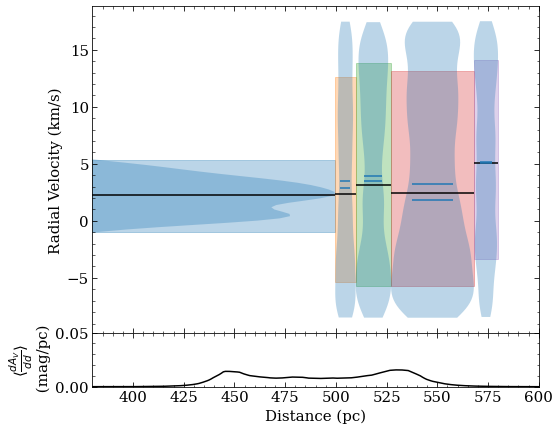

N  22
[213.57409668 432.15319824 461.34616089 490.53912354 517.44128418]
[ 5.1849449   9.74696794 -1.26205418 -5.10192274  3.14820501]
[432.15319824 461.34616089 490.53912354 517.44128418]
(array([-0.08881682, 43.7501816 ]), array([[ 1.13633881e-02, -5.37855484e+00],
       [-5.37855484e+00,  2.55706858e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


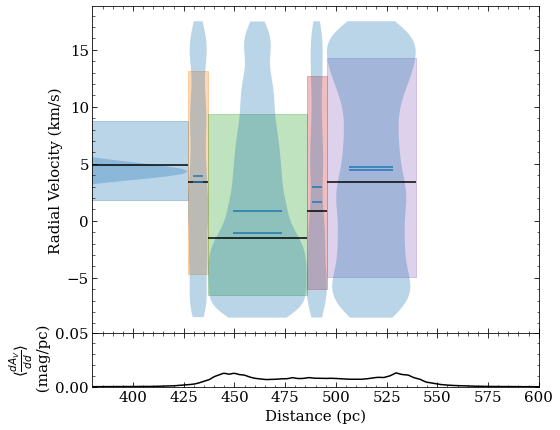

N  23
[214.95378113 435.53582764 454.84368896 495.13400269 528.95458984]
[ 1.3273079  -2.47167686 13.02120385  5.7869382   0.42869292]
[435.53582764 454.84368896 495.13400269 528.95458984]
(array([-0.02071735, 14.20594712]), array([[ 1.29014275e-02, -6.19140765e+00],
       [-6.19140765e+00,  2.98800600e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


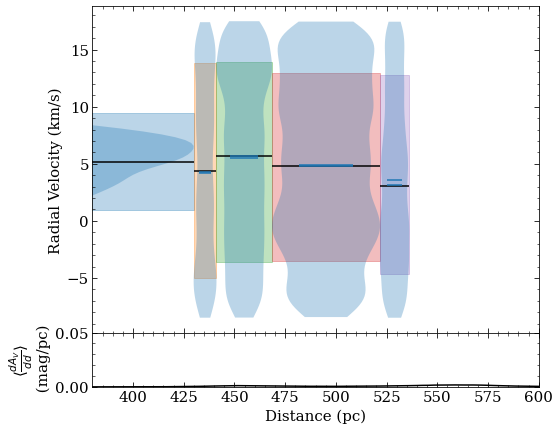

N  24
[207.00686646 419.01873779 434.43841553 487.33325195]
[ 4.40918292 13.39384637 -6.08244423  0.18957209]
[419.01873779 434.43841553 487.33325195]
(array([-0.10707754, 50.32131479]), array([[ 6.09286114e-02, -2.73219187e+01],
       [-2.73219187e+01,  1.23052628e+04]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


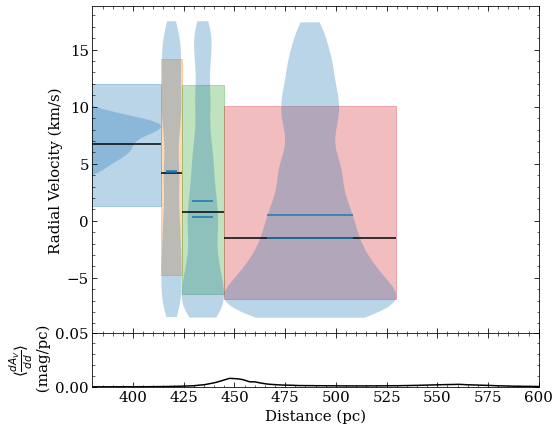

N  25
[216.04150391 477.96185303 532.24731445 545.65893555]
[ 4.06344255 -3.83493061 10.65867721  3.98983931]
[477.96185303 532.24731445 545.65893555]
(array([  0.16154086, -80.13957314]), array([[ 1.50706981e-02, -7.79989763e+00],
       [-7.79989763e+00,  4.04999854e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


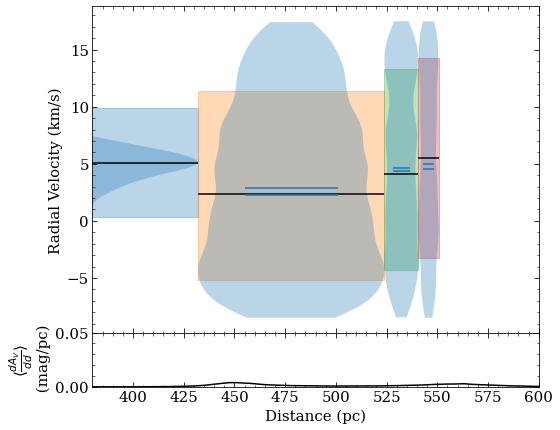

N  26
[222.09228516 452.22607422 473.69592285 507.22869873 538.59765625]
[11.11284291  2.22359863 -1.7947399  -0.36553666 -0.39298491]
[452.22607422 473.69592285 507.22869873 538.59765625]
(array([-0.01804456,  8.8019708 ]), array([[ 8.11923860e-04, -4.00332753e-01],
       [-4.00332753e-01,  1.98262201e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


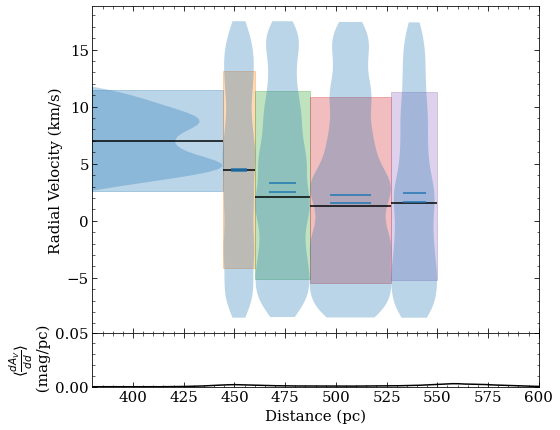

N  27
[195.48640442 401.48950195 425.62158203 463.34292603 498.76361084]
[ 9.3903569   0.83764861  0.50660589  0.81224871 -3.19035021]
[401.48950195 425.62158203 463.34292603 498.76361084]
(array([-0.03644877, 16.03830842]), array([[ 3.77756494e-04, -1.68845008e-01],
       [-1.68845008e-01,  7.59906033e+01]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


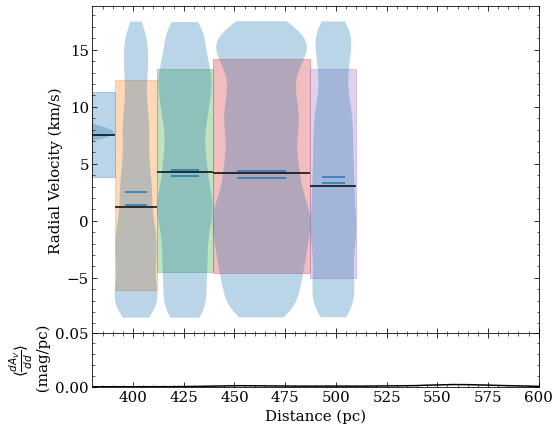

N  28
[210.51916504 438.38296509 460.73260498 493.58361816 535.95922852]
[-2.94840278 -5.8239566  -0.18494303 -3.63752096 -2.90573264]
[438.38296509 460.73260498 493.58361816 535.95922852]
(array([ 0.01212594, -9.01537976]), array([[ 1.41070610e-03, -6.79963929e-01],
       [-6.79963929e-01,  3.29681254e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


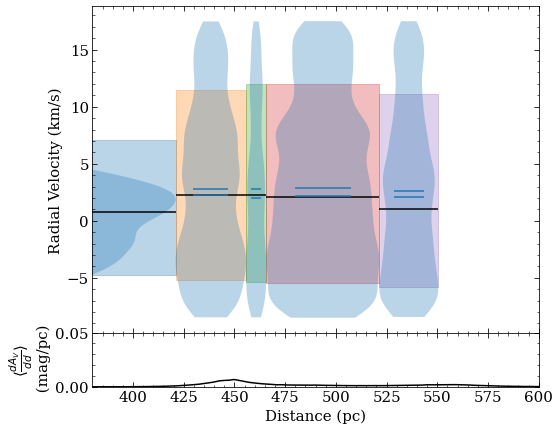

N  29
[206.77056885 418.54614258 434.19604492 465.80810547 530.57946777]
[ 3.71000285 13.15329508  1.79701956  3.31755618  1.54071008]
[418.54614258 434.19604492 465.80810547 530.57946777]
(array([-0.0658466 , 35.21001938]), array([[ 3.83784195e-03, -1.77578855e+00],
       [-1.77578855e+00,  8.28543307e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


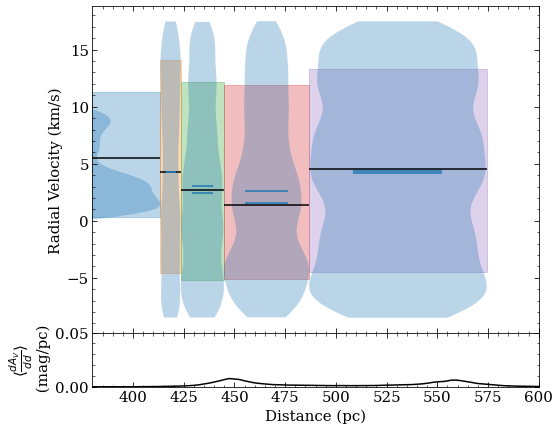

N  30
[220.19250488 471.85272217 517.02026367 551.82226562 577.92944336]
[ 5.63877307 10.46991643 16.11576402  1.75429158  4.04734612]
[471.85272217 517.02026367 551.82226562 577.92944336]
(array([-0.09060674, 55.91479858]), array([[ 5.88381184e-03, -3.10988910e+00],
       [-3.10988910e+00,  1.65301403e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


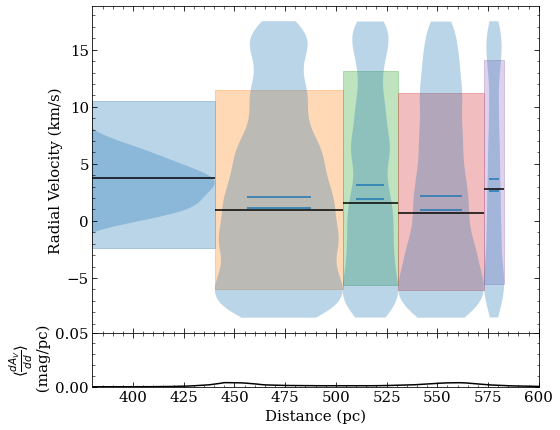

N  31
[211.37388611 430.36367798 483.81658936 534.65856934 552.35644531]
[ 7.50303554 13.34968005  3.06727329 13.57006409  3.17313559]
[430.36367798 483.81658936 534.65856934 552.35644531]
(array([-0.03632879, 26.39196214]), array([[ 5.44916463e-03, -2.72854089e+00],
       [-2.72854089e+00,  1.37818676e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


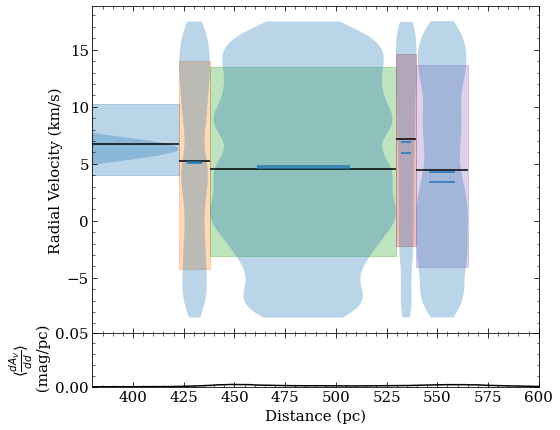

N  32
[200.23141479 412.34213257 429.22644043 439.2364502  516.34985352]
[ 6.45488821  8.17992716 -6.16349669 -2.4407408   5.64978631]
[412.34213257 429.22644043 439.2364502  516.34985352]
(array([  0.03106929, -12.4398443 ]), array([[ 1.03378525e-02, -4.63634694e+00],
       [-4.63634694e+00,  2.09591706e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


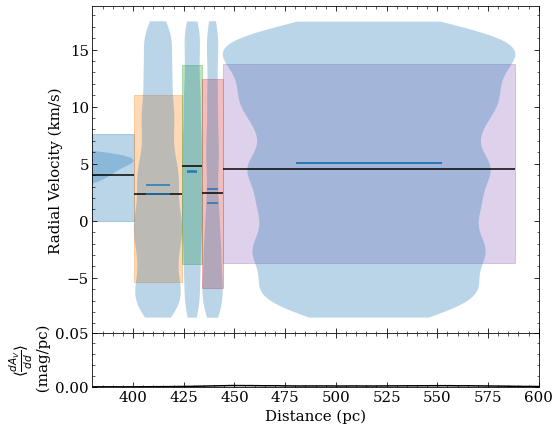

N  33
[239.6151886  484.23538208 494.24539185 504.25540161 547.2366333 ]
[ 2.17733899  5.14203931  5.65780784 -1.33167769  5.42469393]
[484.23538208 494.24539185 504.25540161 547.2366333 ]
(array([ 0.01242506, -2.51171784]), array([[ 6.81078790e-03, -3.46238743e+00],
       [-3.46238743e+00,  1.76426022e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


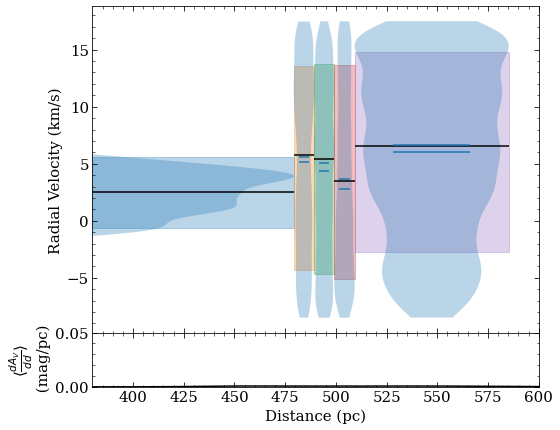

N  34
[205.82478333 422.28259277 437.9206543  464.83258057 496.3112793 ]
[ 4.70637208 11.96582402 11.20793692  4.00364879 11.64774536]
[422.28259277 437.9206543  464.83258057 496.3112793 ]
(array([-0.02322995, 20.23919953]), array([[ 6.74926277e-03, -3.07672999e+00],
       [-3.07672999e+00,  1.40792518e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


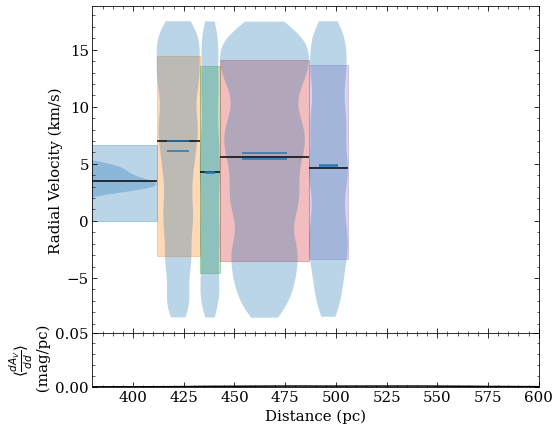

N  35
[227.81976318 460.64453125 476.98376465 495.05426025 511.32839966
 525.87127686 535.88128662 545.89129639 555.90130615 573.08447266]
[ 3.79483897  0.99161408 -0.79893613  0.28294369  1.01045143 -0.23818218
  2.01470219  2.43547926 -2.56829906  4.12019826]
[460.64453125 476.98376465 495.05426025 511.32839966 525.87127686
 535.88128662 545.89129639 555.90130615 573.08447266]
(array([ 0.01359069, -6.37779761]), array([[ 3.57762365e-04, -1.85404701e-01],
       [-1.85404701e-01,  9.65283414e+01]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


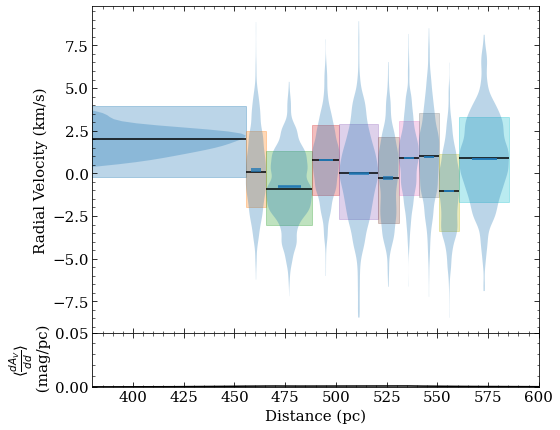

N  36
[206.74967957 435.28875732 464.31118774 493.07519531 525.97216797]
[ 7.09381389 -2.07775217  7.0718636  -1.87296596  2.50355467]
[435.28875732 464.31118774 493.07519531 525.97216797]
(array([ 0.01686073, -6.85661794]), array([[ 6.15438823e-03, -2.94775621e+00],
       [-2.94775621e+00,  1.41869950e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


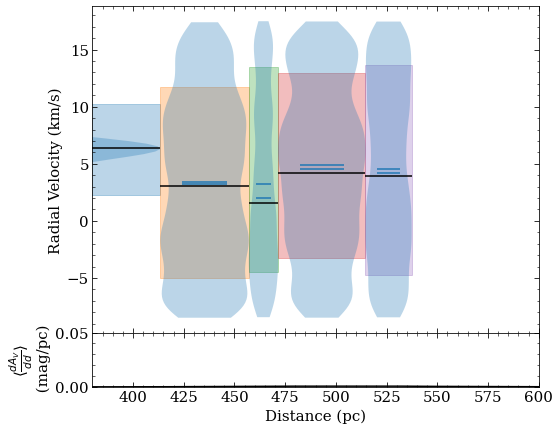

N  37
[218.8600769  481.28717041 529.85919189 542.49023438 555.12127686]
[-0.46074057 15.72976651  0.05200126 -4.78058098 14.26187884]
[481.28717041 529.85919189 542.49023438 555.12127686]
(array([-0.1278454 , 73.57836029]), array([[ 4.31712478e-02, -2.27758213e+01],
       [-2.27758213e+01,  1.20489527e+04]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


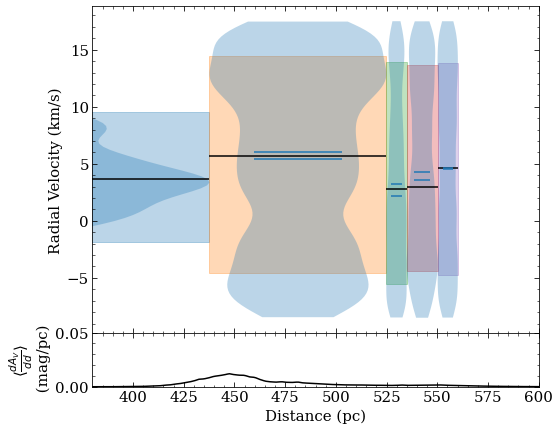

N  38
[214.12335205 433.25170898 443.26171875 472.58877563 541.65667725
 591.40753174]
[ 2.45549365  4.3819104  -3.36292885 -1.41251939  9.2711124  -6.76828047]
[433.25170898 443.26171875 472.58877563 541.65667725 591.40753174]
(array([-0.01702607,  8.86853336]), array([[ 2.86294131e-03, -1.42525227e+00],
       [-1.42525227e+00,  7.20102181e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


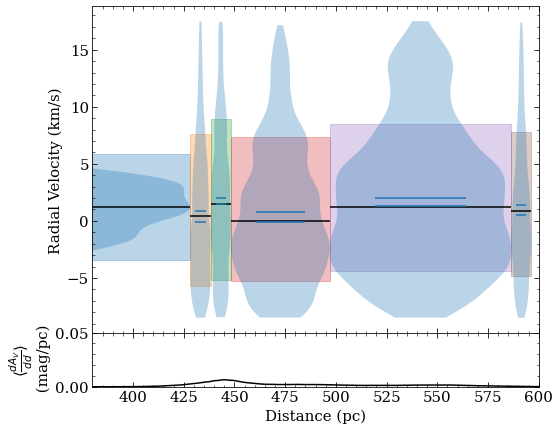

N  39
[188.97488403 448.28384399 523.6229248  542.95056152 564.68536377]
[ 6.79455742 -1.88565705 -0.64179931 14.22391052  1.03400571]
[448.28384399 523.6229248  542.95056152 564.68536377]
(array([  0.06638129, -31.4752698 ]), array([[ 6.59041995e-03, -3.37040646e+00],
       [-3.37040646e+00,  1.73809927e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


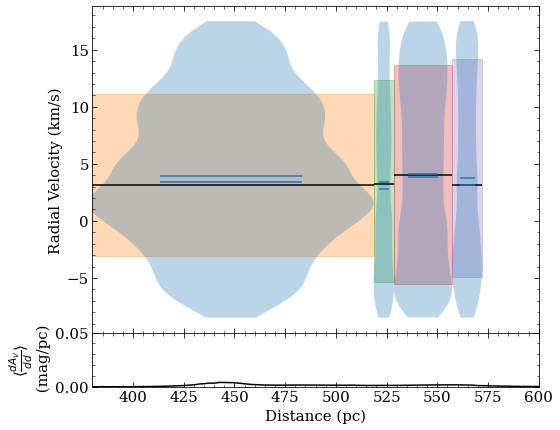

N  40
[233.28396606 471.57293701 499.85574341 538.65112305 569.8381958 ]
[ 4.33837618  1.52410382  1.44223099 17.30272904  7.64947489]
[471.57293701 499.85574341 538.65112305 569.8381958 ]
(array([  0.10576199, -48.20555234]), array([[ 8.74232788e-03, -4.54170834e+00],
       [-4.54170834e+00,  2.37177927e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


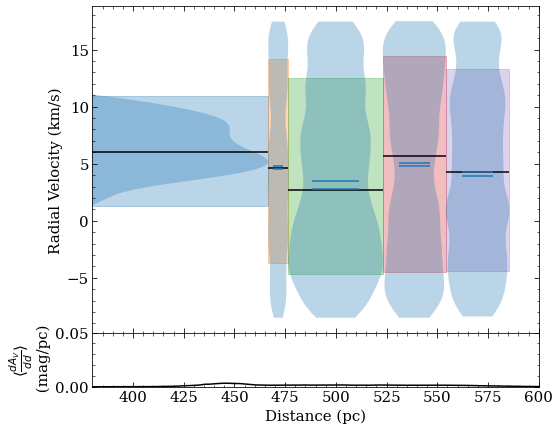

N  41
[200.73881531 408.5067749  421.5760498  466.05230713 509.4934082 ]
[ 6.90289346 -0.02717436 -4.39880333  5.04036018  8.76928735]
[408.5067749  421.5760498  466.05230713 509.4934082 ]
(array([  0.11329805, -48.78689354]), array([[ 1.50910605e-03, -6.80313872e-01],
       [-6.80313872e-01,  3.09030840e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


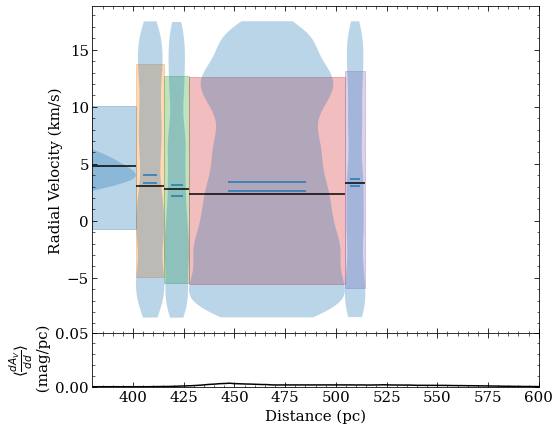

N  42
[201.49081421 407.9866333  424.44656372 479.08331299 538.13928223]
[ 6.76554628 -5.89978428  1.2583831  -1.16151288 -2.21983306]
[407.9866333  424.44656372 479.08331299 538.13928223]
(array([ 0.00685423, -5.13198225]), array([[ 1.20929301e-03, -5.60689088e-01],
       [-5.60689088e-01,  2.63163662e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


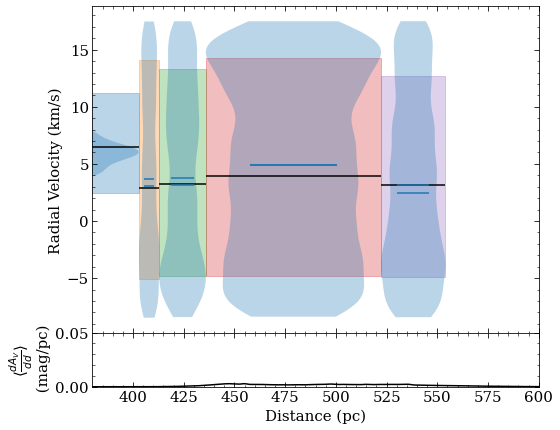

N  43
[203.32804871 415.2633667  440.36413574 483.16668701 520.23779297
 536.00476074]
[ 6.00674394 -1.03927249 -3.91298958  7.97270154  8.59130771 -2.02559079]
[415.2633667  440.36413574 483.16668701 520.23779297 536.00476074]
(array([  0.05009483, -22.28076496]), array([[ 3.48378092e-03, -1.65304535e+00],
       [-1.65304535e+00,  7.91725989e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


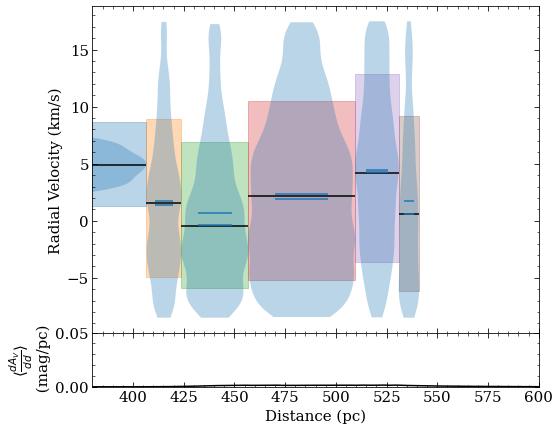

N  44
[221.28341675 454.39385986 471.2258606  487.73562622 543.72821045]
[ 6.67901868  4.13661512 10.580401    0.54236258  3.54566339]
[454.39385986 471.2258606  487.73562622 543.72821045]
(array([-0.03143487, 20.05060497]), array([[ 5.28024260e-03, -2.59140803e+00],
       [-2.59140803e+00,  1.27786746e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


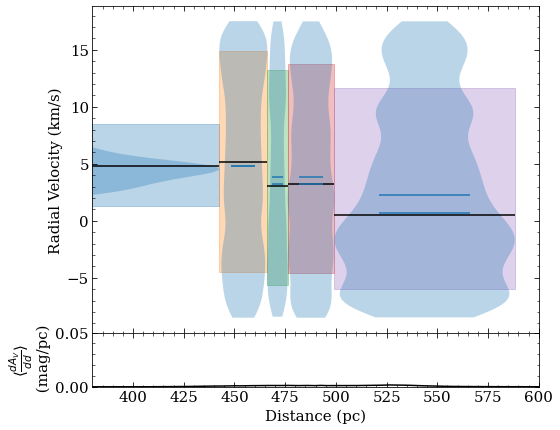

N  45
[212.68962097 466.26867676 512.16308594 528.53637695 557.36102295]
[ 5.91556767  0.41148253 -3.24220128 -4.99115991 -0.4439001 ]
[466.26867676 512.16308594 528.53637695 557.36102295]
(array([-0.01894354,  7.70327622]), array([[ 2.00718971e-03, -1.03830537e+00],
       [-1.03830537e+00,  5.39280678e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


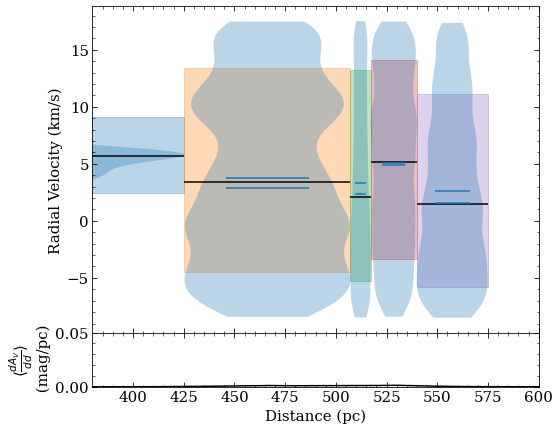

N  46
[201.45639038 415.02432251 432.14086914 442.15087891 492.55157471]
[ 1.10662024e+01  2.27771599e+00  7.41509690e+00 -1.93879937e-03
 -8.98850727e-01]
[415.02432251 432.14086914 442.15087891 492.55157471]
(array([-0.06308794, 30.28015301]), array([[ 4.24441800e-03, -1.89131053e+00],
       [-1.89131053e+00,  8.46293663e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


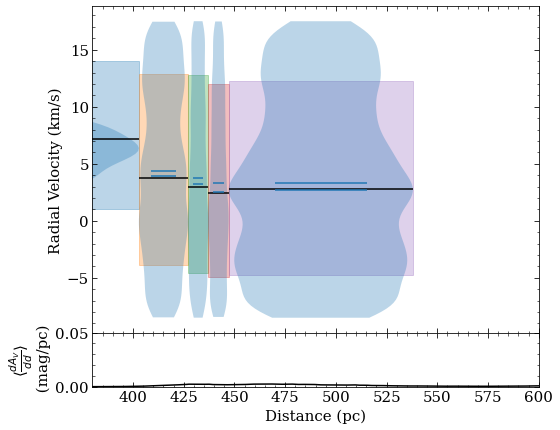

N  47
[198.44839478 423.00939941 471.28234863 525.91235352 563.387146  ]
[ 0.25067139 16.27135668 -2.48054285 -4.81861504  9.32500306]
[423.00939941 471.28234863 525.91235352 563.387146  ]
(array([-0.05778628, 33.19186427]), array([[ 1.15066883e-02, -5.69102967e+00],
       [-5.69102967e+00,  2.84735341e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


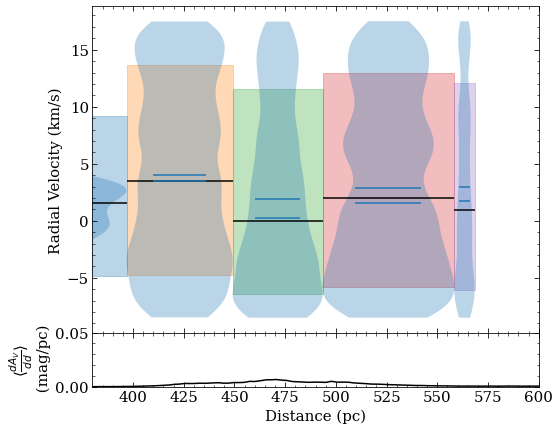

N  48
[226.9566803  476.43264771 505.1619873  527.94378662 563.9107666 ]
[ 5.42337318 -1.4643945  -5.38414032 -2.28411163 -6.46899928]
[476.43264771 505.1619873  527.94378662 563.9107666 ]
(array([-0.04437403, 19.11303445]), array([[ 1.15467406e-03, -5.99445187e-01],
       [-5.99445187e-01,  3.12359128e+02]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


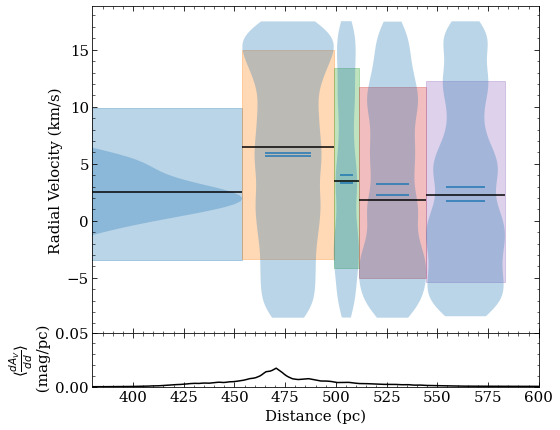

N  49
[241.23228455 491.61413574 523.20007324 560.35461426 585.32714844]
[ 5.38096453 -1.48873489  0.44708917  9.49980896 -1.96935592]
[491.61413574 523.20007324 560.35461426 585.32714844]
(array([  0.03245206, -15.83439804]), array([[ 8.26016336e-03, -4.47056835e+00],
       [-4.47056835e+00,  2.42994994e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


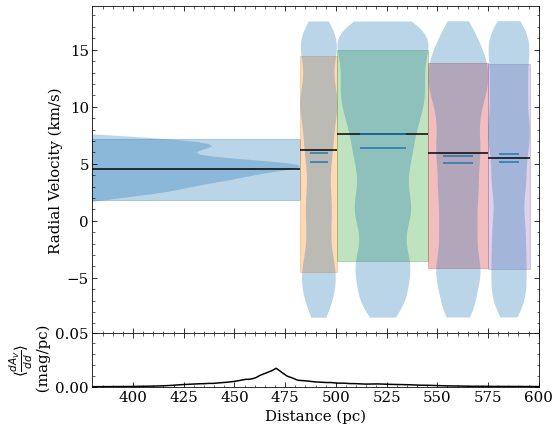

N  50
[202.86845398 410.74191284 427.31384277 443.88580322 457.26516724
 495.30984497]
[-3.21930572 -0.91484761 -7.6620403   0.35590301 -2.52119023  9.17608837]
[410.74191284 427.31384277 443.88580322 457.26516724 495.30984497]
(array([  0.14762545, -66.34924315]), array([[ 4.96757150e-03, -2.22567391e+00],
       [-2.22567391e+00,  1.00132345e+03]]))


/tmp/ipykernel_2683340/3036378297.py:80: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error in 3.6
  fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )


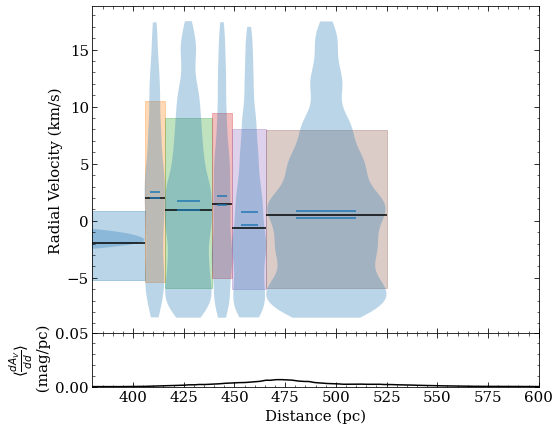

In [22]:
avs = np.zeros(len(sightlines))
for i in range(len(sightlines)):
    sl_i = sightlines[i]
    avs[i] = np.sum(sl_i.voxel_dAVdd)

line = lambda x, m, b : m * x + b

cnorm = matplotlib.colors.Normalize(np.min(avs), np.max(avs))
cmap = plt.get_cmap('viridis')
mappable = matplotlib.cm.ScalarMappable(norm = cnorm,  cmap = cmap)


sightlines_slopes = np.zeros(len(sightlines))
sightlines_slopes_err = np.zeros(len(sightlines))


dist_xx_sl = np.array([])
velo_yy_sl = np.array([])
std_velo_sl = np.array([])


for i in range(len(sightlines)): 
    print('N ', i)
    fig, axs = plt.subplots(nrows = 2, ncols = 1, figsize = (8,7), sharex = True, gridspec_kw={'height_ratios': [6,1], 'hspace': 0})


    dist_xx = np.array([])
    velo_yy = np.array([])
    std_velo = np.array([])
    sl_i = sightlines[i]
    sampler_i = sl_i.sampler
    color = cmap(cnorm(avs[i]))
    color = 'C'+str(i)
    _, __, dist_xx_i, velo_yy_i, std_velo_i = plot_velo(sampler_i, sl = sl_i, min_walker = 10, plot_objs = (fig, axs[0]), color = color, plot_box = True, plot_violin=True, bestprob = True)
    dist_xx = np.concatenate([dist_xx, dist_xx_i])
    velo_yy = np.concatenate([velo_yy, velo_yy_i])
    std_velo = np.concatenate([std_velo, std_velo_i])

    print(dist_xx)
    print(velo_yy)

    dist_sort = np.argsort(dist_xx)
    # print(dist_sort)

    try:
        filt = (dist_xx[dist_sort] >= 380) & (dist_xx[dist_sort] <= 600)
        print(dist_xx[dist_sort][filt])
        fit_result = curve_fit(line, dist_xx[dist_sort][filt], velo_yy[dist_sort][filt], sigma = std_velo[dist_sort][filt])
        print(fit_result)
        fit_params = fit_result[0]
        fit_result_err = np.sqrt(np.diag(fit_result[1]))
        xx_plot = np.linspace(380, 600)

        # axs[0].plot(xx_plot, line(xx_plot, fit_params[0], fit_params[1]), label = 'SL ' + str(i))
        sightlines_slopes[i] = fit_params[0] 
        sightlines_slopes_err[i] = fit_result_err[0]
    except Exception as e:
        print('didn\'t fit properly')
        print(e)
        sightlines_slopes[i] = np.nan

    # ax.plot(sl.stars['DIST'], )
    # axs[0].fill_between(xx_plot, line(xx_plot, fit_params[0] + fit_result_err[0], fit_params[1] + fit_result_err[1]),
    #                     line(xx_plot, fit_params[0] - fit_result_err[0], fit_params[1] - fit_result_err[1]), alpha = 0.1, color = 'C0')

    # ymin, ymax = ax.get_ylim()
    axs[1].plot(dust_data.distance, sl_davdd[i, :], color = 'k')
    # ax.set_ylim(ymin, ymax)
    axs[1].set_xlim(380, 600)
    axs[1].set_xlabel('Distance (pc)')
    axs[1].set_ylabel(r'$ \langle \frac{dA_V}{dd} \rangle $' + '\n (mag/pc)')
    axs[1].set_ylim(0, 0.05)
    fig.set_facecolor('white')

    # for j in range(len(sl_i.stars)):
    #     axs[1].scatter(sl_i.stars['DIST'][j], sl_davdd[i, find_nearest_dist(sl_i.stars['DIST'][j])])

    # axs[0].legend()
    name_i = 'veldist_' + str(i)
    fig.savefig('/uufs/astro.utah.edu/common/home/u1371365/figures/230921_qualfigs/2301015_veldist/{}.png'.format(name_i), overwrite = True )

    plt.show()

    dist_xx_sl = np.concatenate([dist_xx_sl, dist_xx])
    velo_yy_sl = np.concatenate([velo_yy_sl, velo_yy])
    std_velo_sl = np.concatenate([std_velo_sl, std_velo])

In [23]:
velo_yy_sl.shape

(265,)

In [24]:
from scipy.stats import spearmanr

In [25]:
def gradientmetric_deriv(array, dist):    
    a, b = np.meshgrid(array, array)
    c, d = np.meshgrid(dist, dist)
    grad_matrix = np.triu(b - a)
    deltadist = np.triu(d - c)
    nz = grad_matrix != 0
    grad_matrix[nz] = grad_matrix[nz] / deltadist[nz]
    shape = grad_matrix.shape[0]
    return np.sum(grad_matrix) / (0.5 * shape * (shape - 1))

sl_metrics = np.zeros(len(sightlines))
sl_spearman = np.zeros((len(sightlines), 2))


v_all = np.array([], dtype = float)
verr_all = np.array([], dtype = float)
d_all = np.array([], dtype = float)
l_sightline = np.array([], dtype = float)
sl_counts = np.zeros(len(sightlines))
for i in range(len(sightlines)):
    sl_i = sightlines[i]
    ndim = len(sl_i.voxel_dAVdd)
    walker_max = sl_i.sampler.chain.shape[1]
    min_walker_val = walker_max - 100
    sampler = sl_i.sampler
    samples = sampler.chain[:, min_walker_val:, :].reshape((-1, sampler.chain.shape[-1]))
    medians = np.nanmedian(samples[min_walker_val:, :], axis = 0)
    stdevs = np.nanstd(samples[min_walker_val:, :], ddof = 1, axis = 0)

    med_velo = medians[:ndim]
    std_velo = stdevs[:ndim]
    bin_dist = sl_i.bins[1:]

    metric = np.sum(gradientmetric_deriv(med_velo, bin_dist))
    sl_metrics[i] = metric

    spearman_correlation = spearmanr(bin_dist, med_velo)
    sl_spearman[i, 0] = spearman_correlation.correlation
    sl_spearman[i, 1] = spearman_correlation.pvalue

    v_all = np.concatenate([v_all,med_velo])
    verr_all = np.concatenate([verr_all, std_velo]) 
    d_all = np.concatenate([d_all, bin_dist])

    l_sightline = np.concatenate([l_sightline, l_sample[i] * np.ones(len(med_velo))])
    sl_counts[i] = len(med_velo)

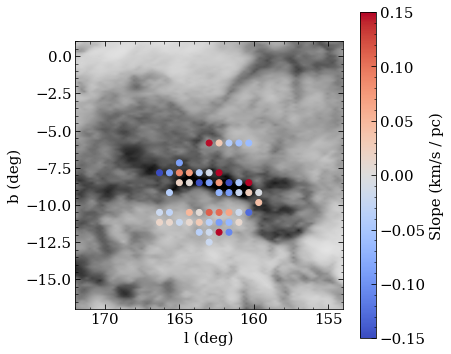

In [26]:
fig, ax = plt.subplots(figsize = (6,6))
im = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'binary', vmin = 0, vmax = 3, extent = (dust_data.l0-9, dust_data.l0+9, dust_data.b0-9, dust_data.b0+9))
# masks = (np.nansum(edenhofer, axis = 2) >= 2.2).astype(float)
# masks_3 = (np.nansum(edenhofer, axis = 2) < 1.5).astype(float)
# im_mask = ax.imshow(np.nansum(edenhofer, axis = 2), origin = 'lower', cmap = 'Reds', alpha = masks, extent = (l0-9, l0+9, b0-9, b0+9))
# im_mask_3 = ax.imshow(np.nansum(edenhofer, axis = 2), origin = 'lower', cmap = 'Purples', alpha = masks_3, extent = (l0-9, l0+9, b0-9, b0+9))
points = ax.scatter(l_sample[:], b_sample[:], c = sightlines_slopes[:], vmin = -0.15, vmax = 0.15, cmap = 'coolwarm')
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
xmin, xmax = ax.get_xlim()
ax.set_xlim(xmax, xmin)
# fig.colorbar(im, label = "A(V)")
fig.colorbar(points, label = 'Slope (km/s / pc)')
plt.show()



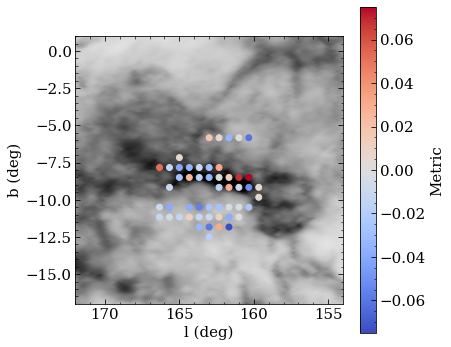

In [27]:
fig, ax = plt.subplots(figsize = (6,6))
im = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'binary', vmin = 0, vmax = 3, extent = (dust_data.l0-9, dust_data.l0+9, dust_data.b0-9, dust_data.b0+9))
# masks = (np.nansum(edenhofer, axis = 2) >= 2.2).astype(float)
# masks_3 = (np.nansum(edenhofer, axis = 2) < 1.5).astype(float)
# im_mask = ax.imshow(np.nansum(edenhofer, axis = 2), origin = 'lower', cmap = 'Reds', alpha = masks, extent = (l0-9, l0+9, b0-9, b0+9))
# im_mask_3 = ax.imshow(np.nansum(edenhofer, axis = 2), origin = 'lower', cmap = 'Purples', alpha = masks_3, extent = (l0-9, l0+9, b0-9, b0+9))
points = ax.scatter(l_sample[:], b_sample[:], c = sl_metrics[:], vmin = -0.075, vmax = 0.075, cmap = 'coolwarm')
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
xmin, xmax = ax.get_xlim()
ax.set_xlim(xmax, xmin)
# fig.colorbar(im, label = "A(V)")
fig.colorbar(points, label = 'Metric')
plt.show()


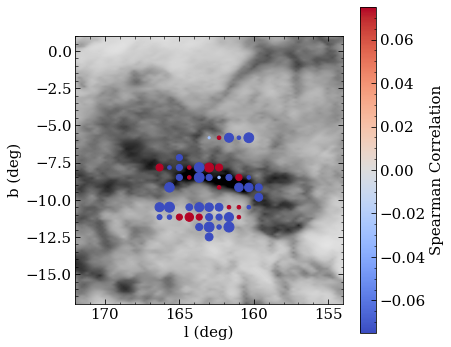

In [28]:
fig, ax = plt.subplots(figsize = (6,6))
im = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'binary', vmin = 0, vmax = 3, extent = (dust_data.l0-9, dust_data.l0+9, dust_data.b0-9, dust_data.b0+9))
# masks = (np.nansum(edenhofer, axis = 2) >= 2.2).astype(float)
# masks_3 = (np.nansum(edenhofer, axis = 2) < 1.5).astype(float)
# im_mask = ax.imshow(np.nansum(edenhofer, axis = 2), origin = 'lower', cmap = 'Reds', alpha = masks, extent = (l0-9, l0+9, b0-9, b0+9))
# im_mask_3 = ax.imshow(np.nansum(edenhofer, axis = 2), origin = 'lower', cmap = 'Purples', alpha = masks_3, extent = (l0-9, l0+9, b0-9, b0+9))
points = ax.scatter(l_sample[:], b_sample[:], c = sl_spearman[:, 0], s= 100 * (1-sl_spearman[:, 1]), vmin = -0.075, vmax = 0.075, cmap = 'coolwarm')
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
xmin, xmax = ax.get_xlim()
ax.set_xlim(xmax, xmin)
# fig.colorbar(im, label = "A(V)")
fig.colorbar(points, label = 'Spearman Correlation')
plt.show()


In [29]:
sl_spearman.astype(np.float16)

array([[-0.5    ,  0.391  ],
       [-0.4    ,  0.5044 ],
       [-0.6    ,  0.2847 ],
       [-0.6    ,  0.2847 ],
       [ 0.     ,  1.     ],
       [ 0.1    ,  0.873  ],
       [-0.8    ,  0.10406],
       [-0.1    ,  0.873  ],
       [ 0.4    ,  0.6    ],
       [-0.3    ,  0.624  ],
       [-0.0357 ,  0.9395 ],
       [-0.3    ,  0.624  ],
       [-0.9    ,  0.03738],
       [ 0.1    ,  0.873  ],
       [-0.3    ,  0.624  ],
       [ 0.4    ,  0.5044 ],
       [ 0.7    ,  0.1881 ],
       [-0.7144 ,  0.07135],
       [ 0.0857 ,  0.8716 ],
       [-0.3    ,  0.624  ],
       [-0.1    ,  0.873  ],
       [ 0.4    ,  0.5044 ],
       [-0.3    ,  0.624  ],
       [-0.5    ,  0.391  ],
       [-1.     ,  0.     ],
       [-0.2    ,  0.8    ],
       [-0.9    ,  0.03738],
       [-0.4    ,  0.5044 ],
       [ 0.1    ,  0.873  ],
       [-0.7    ,  0.1881 ],
       [-0.3    ,  0.624  ],
       [-0.4    ,  0.5044 ],
       [ 0.3    ,  0.624  ],
       [ 0.6    ,  0.2847 ],
       [ 0.3  

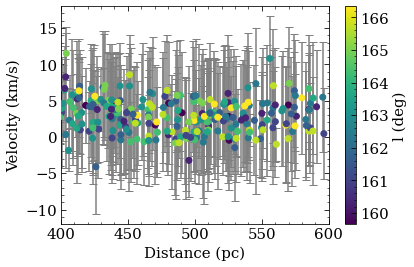

In [30]:
fig, ax = plt.subplots()
fil = np.nansum(crit_filament)
fil_idx = np.sum(sl_counts[:fil]).astype(int)
start = 0
stop = None
ax.errorbar(d_all[start:stop], v_all[start:stop], yerr = verr_all[start:stop], fmt = '.', capsize = 4, color = 'grey')

points = ax.scatter(d_all[start:stop], v_all[start:stop], c = l_sightline[start:stop], zorder = 5, )

ax.set_xlim(400, 600)
ax.set_xlabel('Distance (pc)')
ax.set_ylabel('Velocity (km/s)')
fig.colorbar(points, label = 'l (deg)')
plt.show()